# Predicting diabetes status using NHANES

[DSLC stages]: Analysis



The following code sets up the libraries and creates cleaned and pre-processed training, validation and test data that we will use in this document.

In [32]:
import pandas as pd
import numpy as np

# Load the datasets from CSV files
train_data = pd.read_csv('train_data.csv')
val_data = pd.read_csv('val_data.csv')
test_data = pd.read_csv('test_data.csv')
dictionary = pd.read_csv('dictionary.csv', index_col=0)

train_time_data = pd.read_csv('train_time_data.csv')
val_time_data = pd.read_csv('val_time_data.csv')
test_time_data = pd.read_csv('test_time_data.csv')
dict_time_series = pd.read_csv('dict_time_series.csv', index_col=0)
time_series_cat_labels = pd.read_csv('time_series_cat_labels.csv', index_col=0)

test_2020_data = pd.read_csv('test_2020_data.csv')

data_States = pd.read_csv('data_States.csv')
data_register = pd.read_csv('data_register.csv')
data_income = pd.read_csv('data_income.csv')
data_noVote = pd.read_csv('data_noVote.csv')

# Time Series PCA Analysis

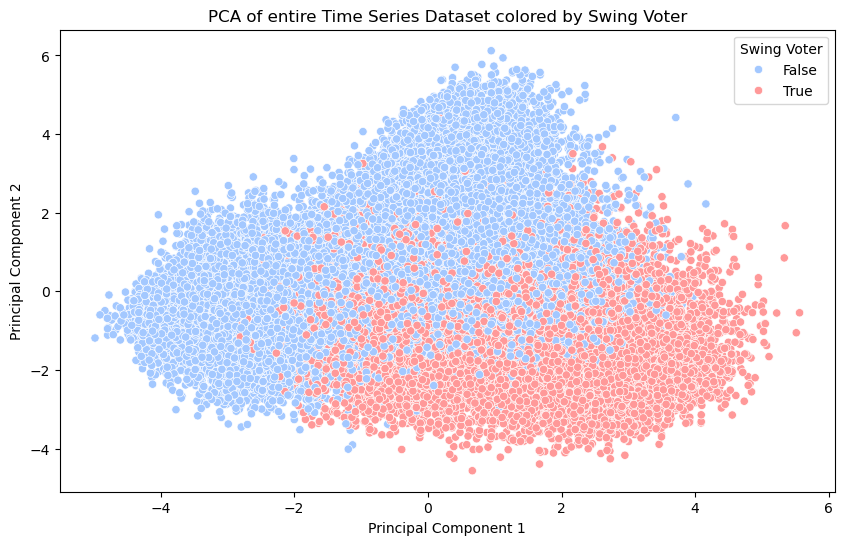

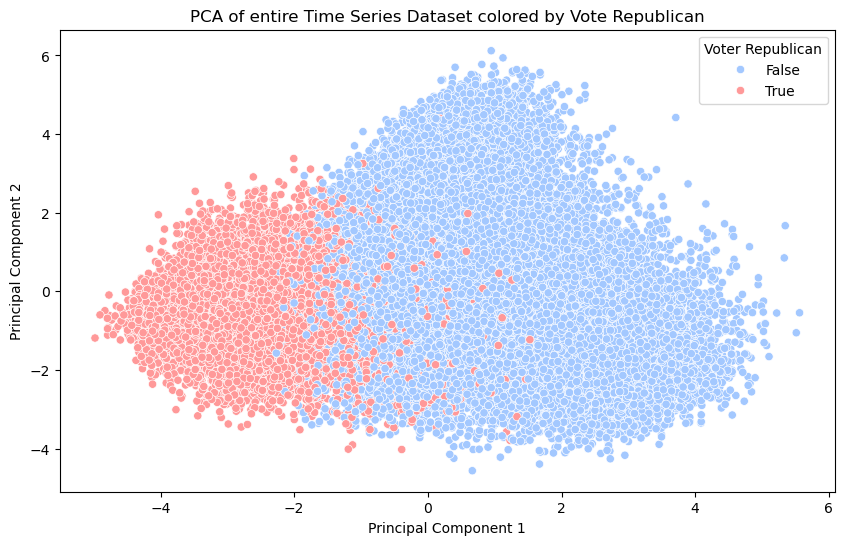

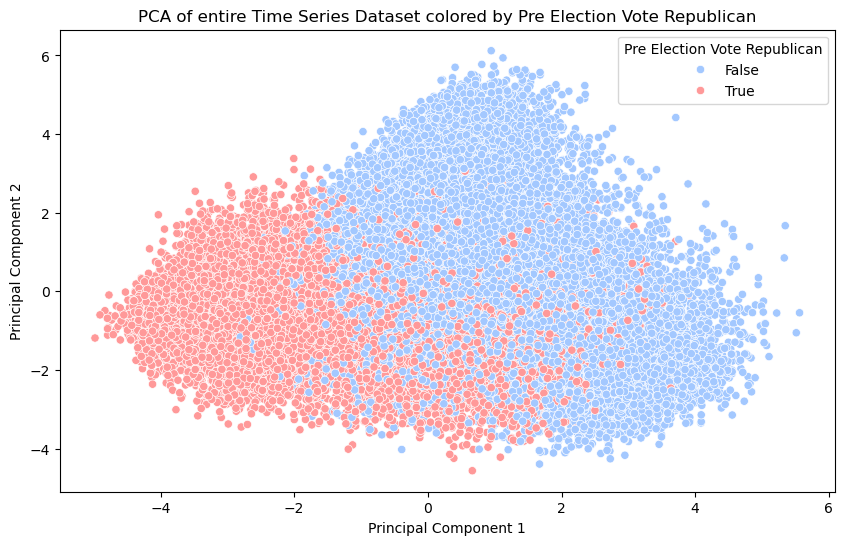

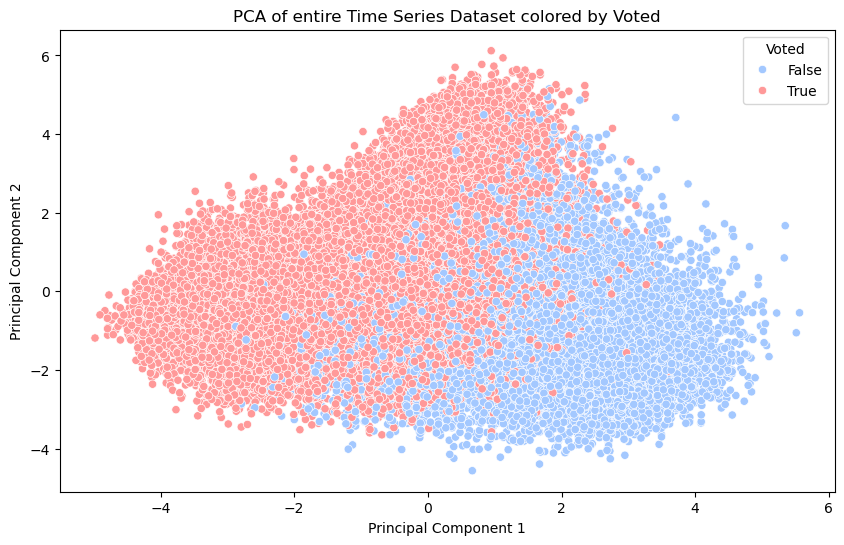

In [53]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import pandas as pd

# Standardizing the data before PCA
scaler = StandardScaler()
scaled_data = scaler.fit_transform(train_time_data)

# Apply PCA to the data and reduce it to 2 components
pca = PCA(n_components=2)
pca_components = pca.fit_transform(scaled_data)

pca_df = pd.DataFrame()

# Add the PCA components to the dataframe
pca_df['PC1'] = pca_components[:, 0]
pca_df['PC2'] = pca_components[:, 1]

# Define custom color palettes for True and False
custom_palette = {True: "#FF9999", False: "#A3C8FF"}  # True is red, False is blue

# Plot each case with swapped colors
plt.figure(figsize=(10, 6))
sns.scatterplot(x=pca_df['PC1'], y=pca_df['PC2'], hue=train_time_data['swing_voter'], 
                palette=custom_palette, legend='full')
plt.title('PCA of entire Time Series Dataset colored by Swing Voter')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Swing Voter')
plt.show()

plt.figure(figsize=(10, 6))
sns.scatterplot(x=pca_df['PC1'], y=pca_df['PC2'], hue=train_time_data['VotePresident_Republican'], 
                palette=custom_palette, legend='full')
plt.title('PCA of entire Time Series Dataset colored by Vote Republican')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Voter Republican')
plt.show()

plt.figure(figsize=(10, 6))
sns.scatterplot(x=pca_df['PC1'], y=pca_df['PC2'], hue=train_time_data['PRE_IntentVote_Republican'], 
                palette=custom_palette, legend='full')
plt.title('PCA of entire Time Series Dataset colored by Pre Election Vote Republican')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Pre Election Vote Republican')
plt.show()

plt.figure(figsize=(10, 6))
sns.scatterplot(x=pca_df['PC1'], y=pca_df['PC2'], hue=train_time_data['Voted_Yes'], 
                palette=custom_palette, legend='full')
plt.title('PCA of entire Time Series Dataset colored by Voted')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Voted')
plt.show()


# 2020 PCA Analysis

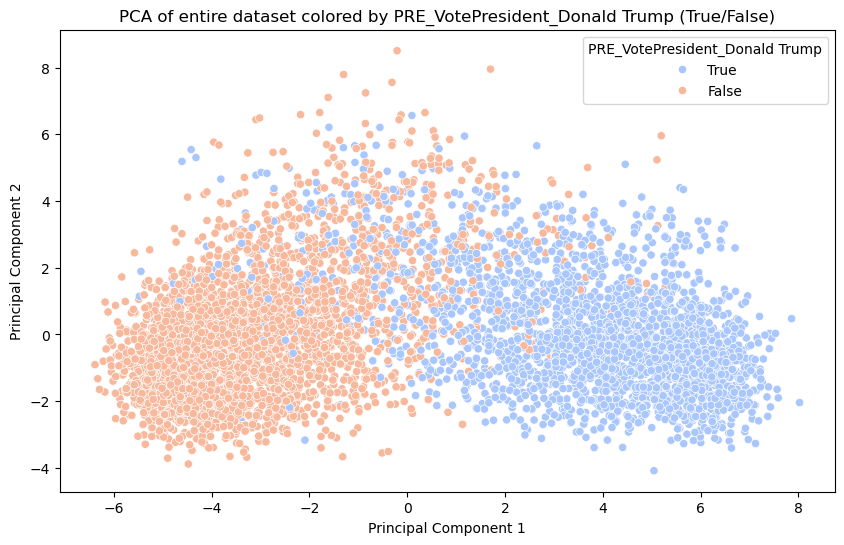

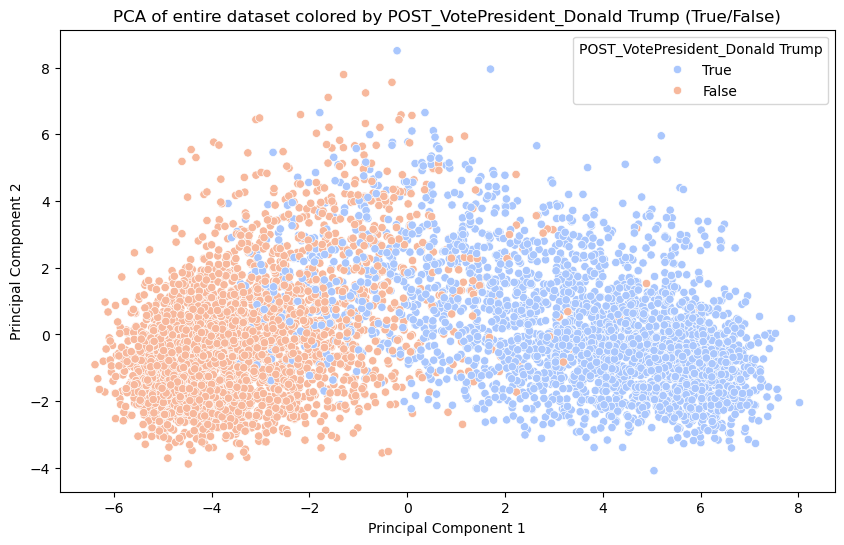

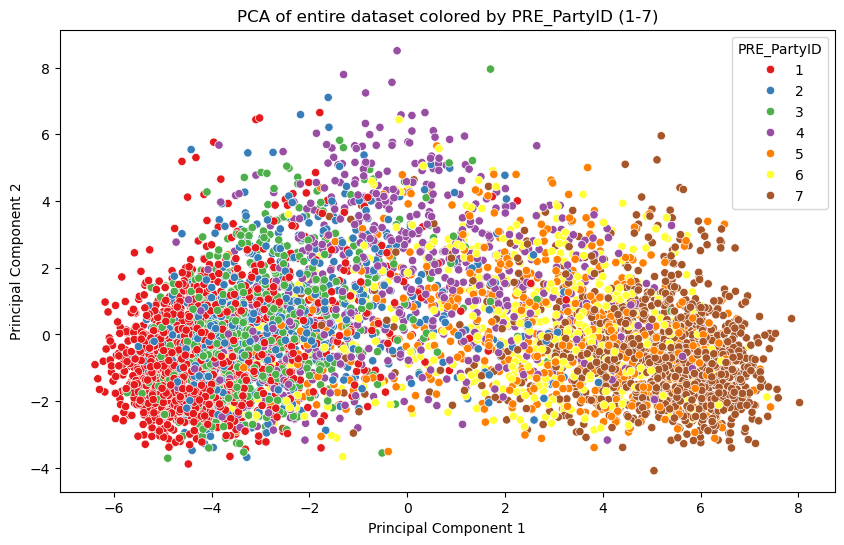

In [74]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Standardizing the data before PCA
scaler = StandardScaler()
scaled_data = scaler.fit_transform(train_data)

# Apply PCA to the data and reduce it to 2 components
pca = PCA(n_components=2)
pca_components = pca.fit_transform(scaled_data)

pca_df = pd.DataFrame()

# Add the PCA components to the dataframe
pca_df['PC1'] = pca_components[:, 0]
pca_df['PC2'] = pca_components[:, 1]

# Plot the data colored by 'PRE_VotePresident_Donald Trump'
plt.figure(figsize=(10, 6))
sns.scatterplot(x=pca_df['PC1'], y=pca_df['PC2'], hue=train_data['PRE_VotePresident_Donald Trump'].astype(str), 
                palette='coolwarm', legend='full')
plt.title('PCA of entire dataset colored by PRE_VotePresident_Donald Trump (True/False)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='PRE_VotePresident_Donald Trump')
plt.show()

# Plot the data colored by 'POST_VotePresident_Donald Trump'
plt.figure(figsize=(10, 6))
sns.scatterplot(x=pca_df['PC1'], y=pca_df['PC2'], hue=train_data['POST_VotePresident_Donald Trump'].astype(str), 
                palette='coolwarm', legend='full')
plt.title('PCA of entire dataset colored by POST_VotePresident_Donald Trump (True/False)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='POST_VotePresident_Donald Trump')
plt.show()

# Plot the data colored by 'PRE_PartyID' (values 1-7)
plt.figure(figsize=(10, 6))
sns.scatterplot(x=pca_df['PC1'], y=pca_df['PC2'], hue=train_data['PRE_PartyID'], 
                palette='Set1', legend='full')
plt.title('PCA of entire dataset colored by PRE_PartyID (1-7)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='PRE_PartyID')
plt.show()


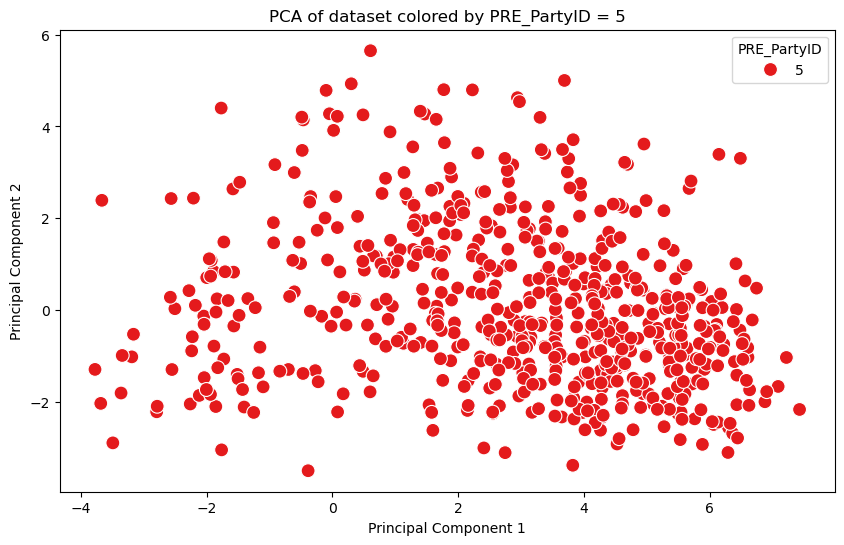

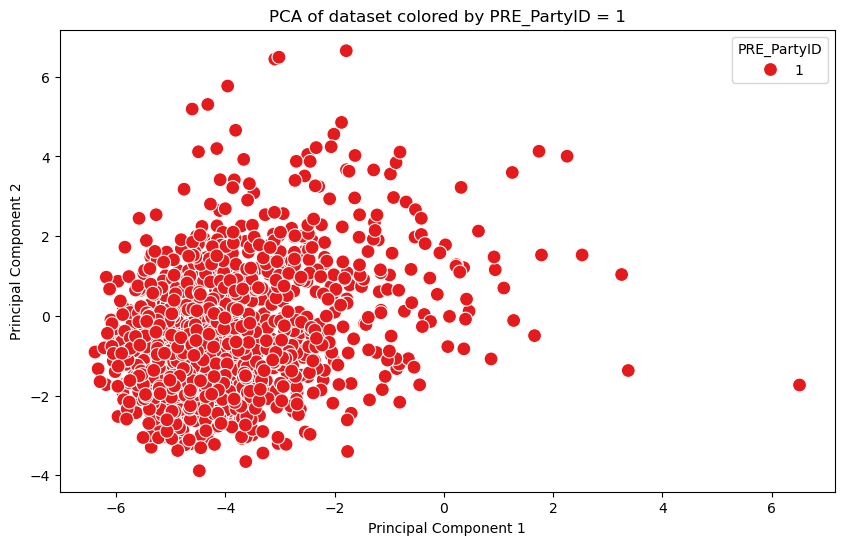

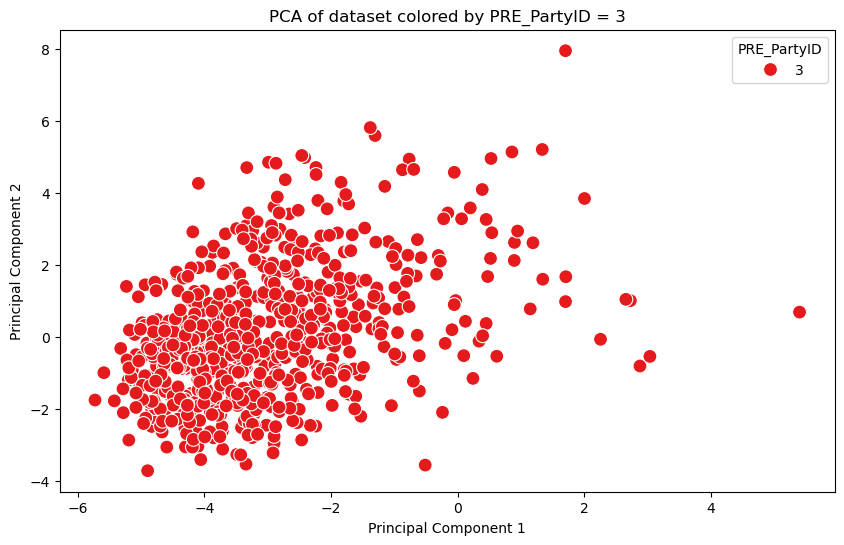

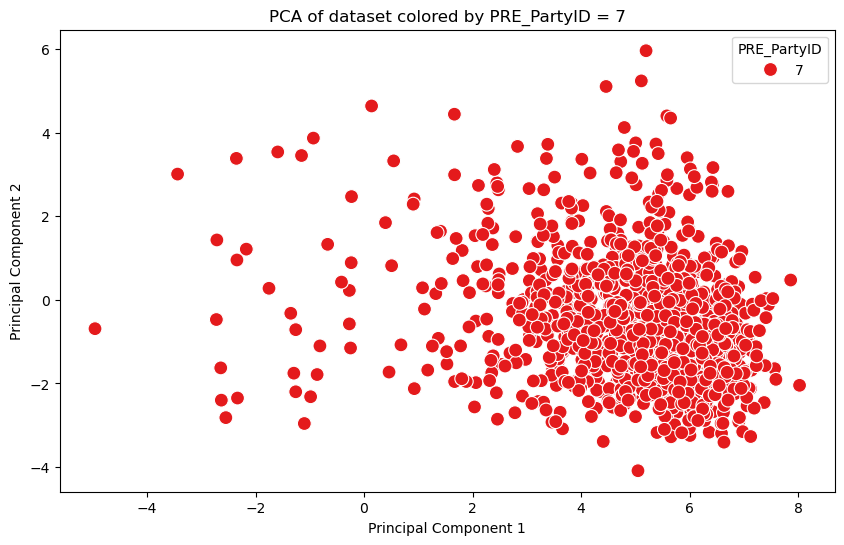

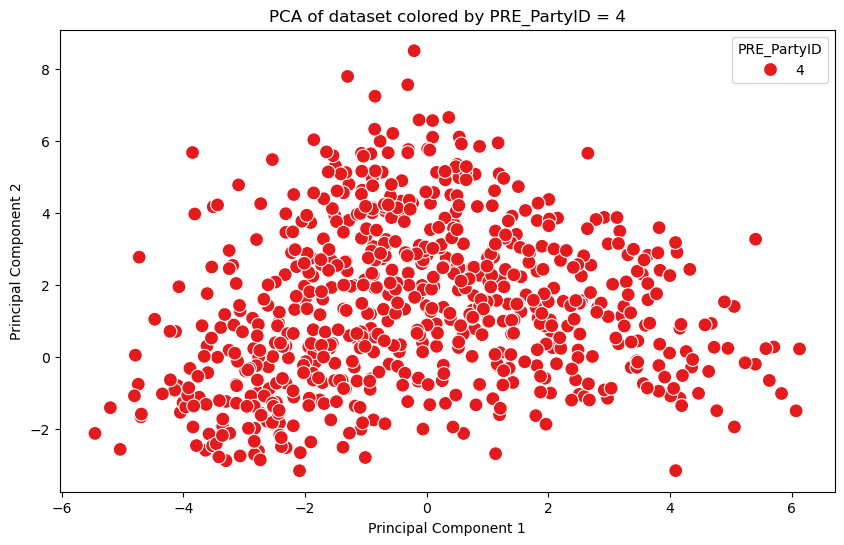

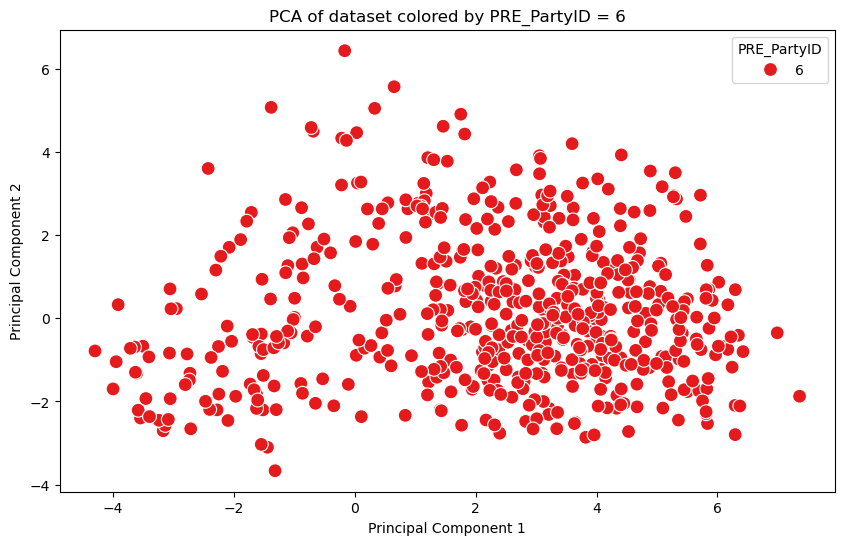

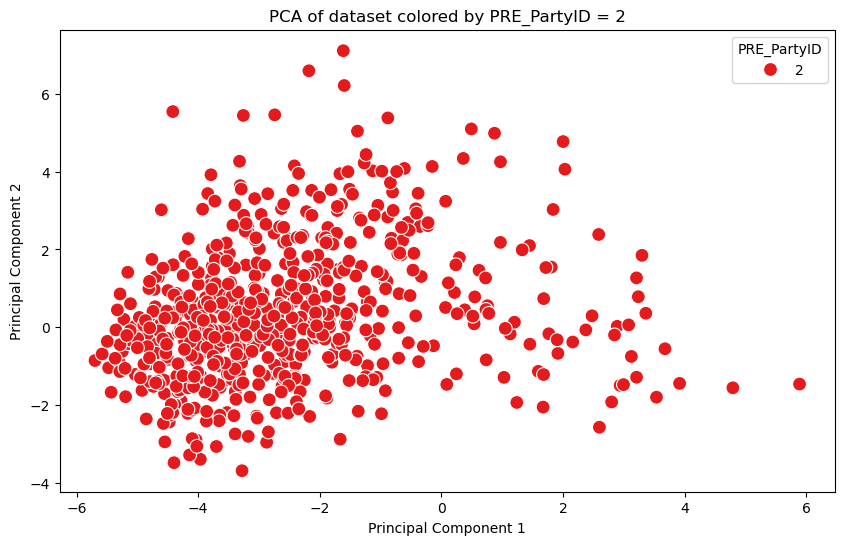

In [75]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler


# Plot the data for each PRE_PartyID value separately
party_ids = train_data['PRE_PartyID'].unique()

pca_df['PRE_PartyID'] = train_data['PRE_PartyID'].values

# Loop through each party ID value and plot the data
for party_id in party_ids:
    plt.figure(figsize=(10, 6))
    
    # Filter data for the specific party ID value
    party_data = pca_df[pca_df['PRE_PartyID'] == party_id]
    
    # Plotting
    sns.scatterplot(x=party_data['PC1'], y=party_data['PC2'], hue=party_data['PRE_PartyID'], 
                    palette='Set1', legend='full', markers='o', s=100)
    
    # Title and labels
    plt.title(f'PCA of dataset colored by PRE_PartyID = {party_id}')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.legend(title='PRE_PartyID')
    plt.show()


In [76]:
# Plot the data colored by 'PRE_VotePresident_Donald Trump'
plt.figure(figsize=(10, 6))
sns.scatterplot(x=train_data['PC1'], y=train_data['PC2'], hue=train_data['mentionFox'].astype(str), 
                palette='coolwarm', legend='full')
plt.title('PCA of entire dataset colored by Mention Fox')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Mention Fox')
plt.show()

# Plot the data colored by 'PRE_VotePresident_Donald Trump'
plt.figure(figsize=(10, 6))
sns.scatterplot(x=pca_df['PC1'], y=pca_df['PC2'], hue=train_data['mentionCNN'].astype(str), 
                palette='coolwarm', legend='full')
plt.title('PCA of entire dataset colored by Mention CNN')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Mention CNN')
plt.show()

# Plot the data colored by 'PRE_VotePresident_Donald Trump'
plt.figure(figsize=(10, 6))
sns.scatterplot(x=pca_df['PC1'], y=pca_df['PC2'], hue=train_data['mentionABC'].astype(str), 
                palette='coolwarm', legend='full')
plt.title('PCA of entire dataset colored by Mention ABC')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Mention ABC')
plt.show()

KeyError: 'PC1'

<Figure size 1000x600 with 0 Axes>

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Filter the data for swing_voters

pca_df['swing_voter'] = train_data['swing_voter']
swing_voters_data = pca_df[pca_df['swing_voter'] == True]

# Plot the data colored by 'mentionFox'
plt.figure(figsize=(10, 6))
sns.scatterplot(x=swing_voters_data['PC1'], y=swing_voters_data['PC2'], 
                hue=train_data['mentionFox'].astype(str), palette='coolwarm', legend='full')
plt.title('PCA of Swing Voters Colored by Mention Fox')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Mention Fox')
plt.show()

# Plot the data colored by 'mentionCNN'
plt.figure(figsize=(10, 6))
sns.scatterplot(x=swing_voters_data['PC1'], y=swing_voters_data['PC2'], 
                hue=train_data['mentionCNN'].astype(str), palette='coolwarm', legend='full')
plt.title('PCA of Swing Voters Colored by Mention CNN')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Mention CNN')
plt.show()

# Plot the data colored by 'mentionABC'
plt.figure(figsize=(10, 6))
sns.scatterplot(x=swing_voters_data['PC1'], y=swing_voters_data['PC2'], 
                hue=train_data['mentionABC'].astype(str), palette='coolwarm', legend='full')
plt.title('PCA of Swing Voters Colored by Mention ABC')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Mention ABC')
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Categorize the 'age' column into age groups
def categorize_age(age):
    if 18 <= age <= 24:
        return '18-24'
    elif 25 <= age <= 44:
        return '25-44'
    elif 45 <= age <= 64:
        return '45-64'
    else:
        return '65+'

# Apply the categorization function to the 'age' column
train_data['age_group'] = train_data['Age'].apply(categorize_age)

# Standardizing the data before PCA (same as before)
columns_for_pca = [col for col in train_data.columns if col not in ['PRE_VotePresident_Donald Trump', 
                                                                   'POST_VotePresident_Donald Trump', 
                                                                   'PRE_PartyID', 'Age', 'age_group']]

scaler = StandardScaler()
scaled_data = scaler.fit_transform(train_data[columns_for_pca])

# Apply PCA to the data and reduce it to 2 components
pca = PCA(n_components=2)
pca_components = pca.fit_transform(scaled_data)

# Add the PCA components to the dataframe
train_data['PC1'] = pca_components[:, 0]
train_data['PC2'] = pca_components[:, 1]

# Plot all the data with colors based on age group
plt.figure(figsize=(10, 6))

# Plotting the scatter plot
sns.scatterplot(x=pca_df['PC1'], y=pca_df['PC2'], hue=train_data['age_group'], 
                palette='Set2', legend='full', markers='o', s=100)

# Title and labels
plt.title('PCA of dataset colored by Age Group')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Age Group')

plt.show()


In [ ]:
# Plot the data colored by 'PRE_VotePresident_Donald Trump'
plt.figure(figsize=(10, 6))
sns.scatterplot(x=pca_df['PC1'], y=pca_df['PC2'], hue=train_data['Sex_Female'].astype(str), 
                palette='coolwarm', legend='full')
plt.title('PCA of entire dataset colored by Sex')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Sex')
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# List of all columns in your dataset
all_columns = train_data.columns

# Filter columns containing 'StateRegistration'
state_columns = [col for col in all_columns if 'StateRegistration' in col]

pca_df[state_columns] = train_data[state_columns].values

# Loop through each state column to generate a separate plot
for state_col in state_columns:
    if state_col in train_data.columns:  # Check if the column exists in the data
        plt.figure(figsize=(10, 6))

        # Filter data where the state column is True
        state_data = pca_df[pca_df[state_col] == True]

        # Plotting the data (no age grouping, just the data points)
        sns.scatterplot(x=state_data['PC1'], y=state_data['PC2'], s=100, marker='o')

        # Title and labels
        plt.title(f'PCA of dataset for {state_col} where value is True')
        plt.xlabel('Principal Component 1')
        plt.ylabel('Principal Component 2')

        # Show plot
        plt.show()



# Trend Analysis

In [2]:
import matplotlib.pyplot as plt

def analyze_trends(df, dict_time_series, swing_voter_filter=False): 
    """
    Analyze trends for each column in the dictionary using the Year column for grouping.
    This version fixes layout issues and handles one-hot encoded columns that may be missing a category.
    
    Parameters:
        df (pd.DataFrame): Input DataFrame with the data.
        dict_time_series (pd.DataFrame): DataFrame defining columns and their types.

    Returns:
        None: Visualizes trends for each column over time with standardized plot size and layout.
    """
    # Ensure the "Year" column exists for grouping
    time_column = dict_time_series.loc["VCF0004"]["column"]  # "Year"
    if time_column not in df.columns:
        raise ValueError(f"Time column '{time_column}' not found in DataFrame.")
        
    # Apply swing voter filter if specified
    if swing_voter_filter:
        if "swing_voter" not in df.columns:
            raise ValueError("The `swing_voter` column is not found in the DataFrame.")
        df = df[df["swing_voter"] == True]

    # Get the unique years for the x-axis limits
    unique_years = sorted(df[time_column].unique())

    # Standardized plot size (width, height) in inches
    plot_width = 12
    plot_height = 8

    # Iterate over each row in the DataFrame (i.e., the metadata for each entry)
    for idx, row in dict_time_series.iterrows():
        column_name = row["column"]
        column_type = row["type"]

        # Skip the time column itself
        if column_name == time_column:
            continue

        if column_type == "cat":
            # Handle categorical (one-hot encoded) columns
            category_prefix = column_name  # Prefix for one-hot encoding
            matching_columns = [col for col in df.columns if col.startswith(category_prefix)]

            if not matching_columns:
                print(f"No one-hot encoded columns found for '{column_name}'.")
                continue

            # If only one matching column exists, handle it separately
            if len(matching_columns) == 1:
                # No need to normalize since there is only one category (True/False)
                trend = df.groupby(time_column)[matching_columns[0]].sum()
                trend_percentage = (trend / df.groupby(time_column).size()) * 100
                
            else:
                # Aggregate one-hot encoded columns by year as percentages
                trend = df.groupby(time_column)[matching_columns].sum()

                # Ensure both True and False categories are reflected, even if one is missing
                if 'True' in matching_columns:
                    missing_column = [col for col in matching_columns if col != 'True'][0]
                    trend[missing_column] = trend[missing_column].fillna(0)
                else:
                    # Add a 'True' column if it doesn't exist
                    trend['True'] = 0

                # Normalize to percentages (considering both True and False categories)
                trend_percentage = trend.div(trend.sum(axis=1), axis=0) * 100

            # Plot the trend with standardized size and x-axis
            plt.figure(figsize=(plot_width, plot_height))
            trend_percentage.plot(ax=plt.gca(), kind="line", linewidth=2)

            plt.title(f"Percentage Trend for {column_name} (Categorical)", fontsize=14)
            plt.xlabel("Year", fontsize=12)
            plt.ylabel("Percentage (%)", fontsize=12)
            plt.xticks(unique_years, rotation=45, fontsize=10)  # Consistent x-axis labels
            plt.yticks(fontsize=10)
            plt.legend(
                title="Categories", 
                bbox_to_anchor=(1.05, 1), 
                loc="upper left", 
                fontsize=10
            )
            plt.tight_layout()  # Adjust layout to prevent overlap
            plt.show()

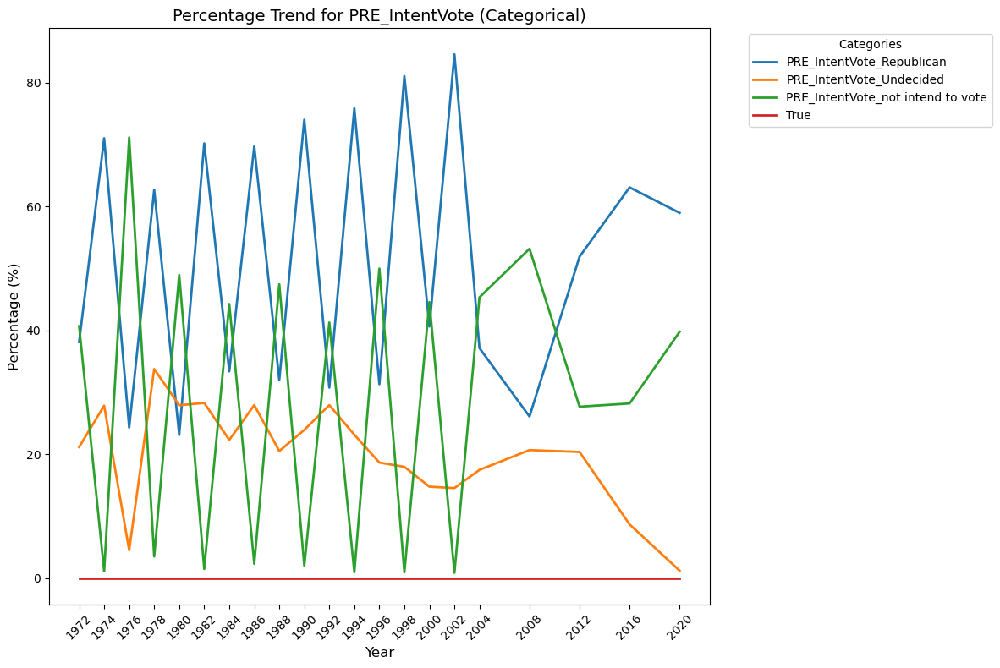

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


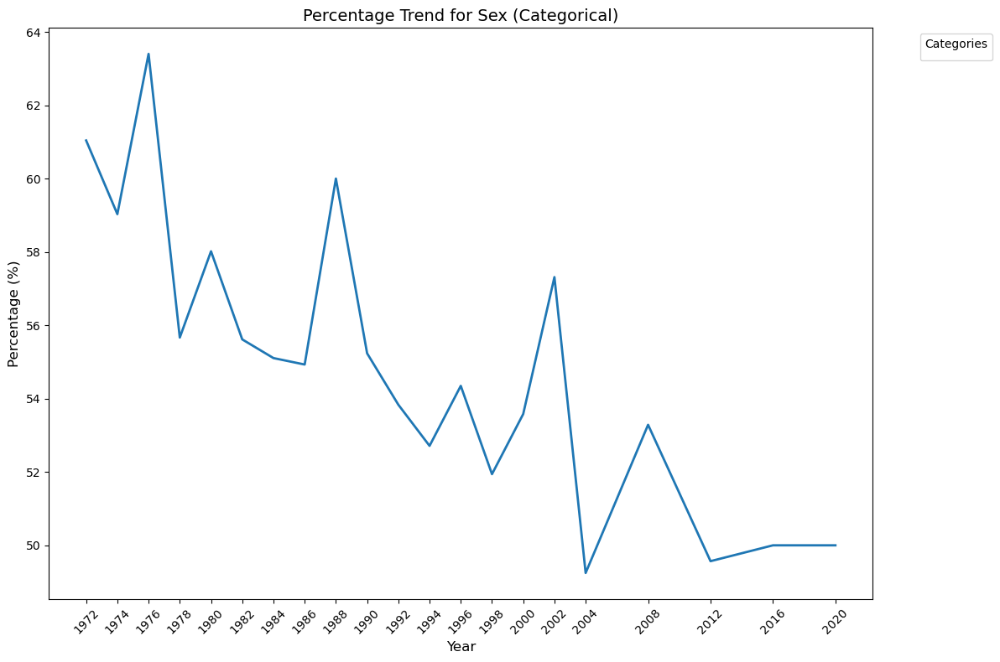

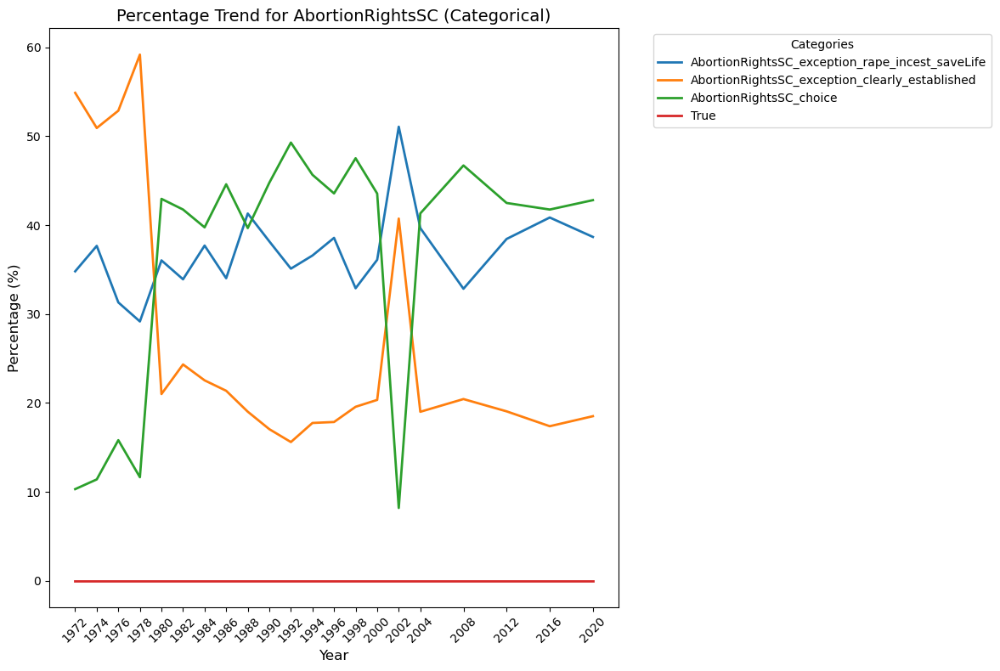

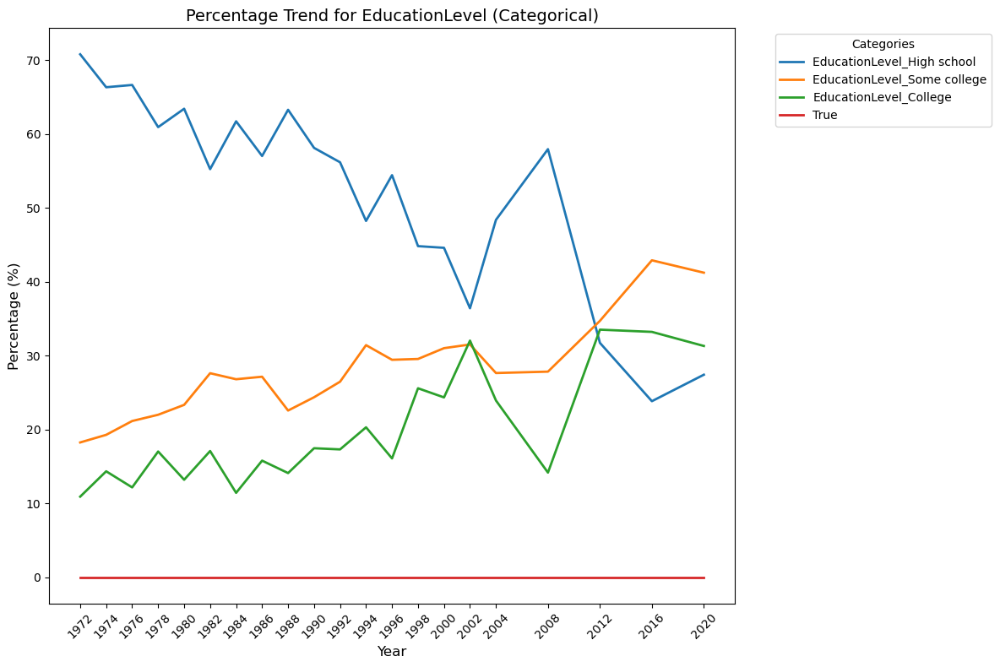

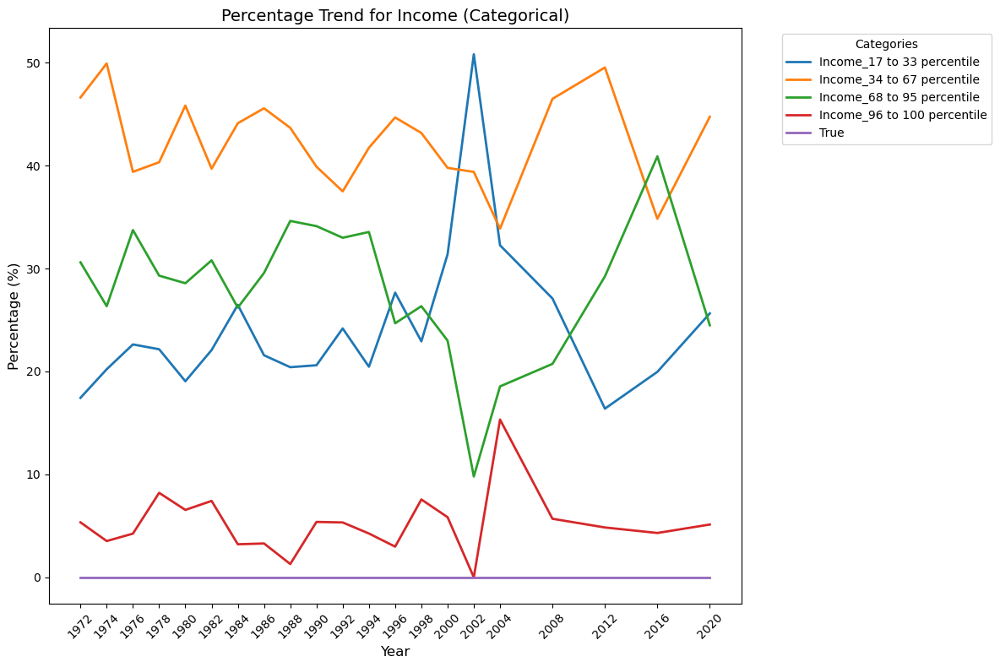

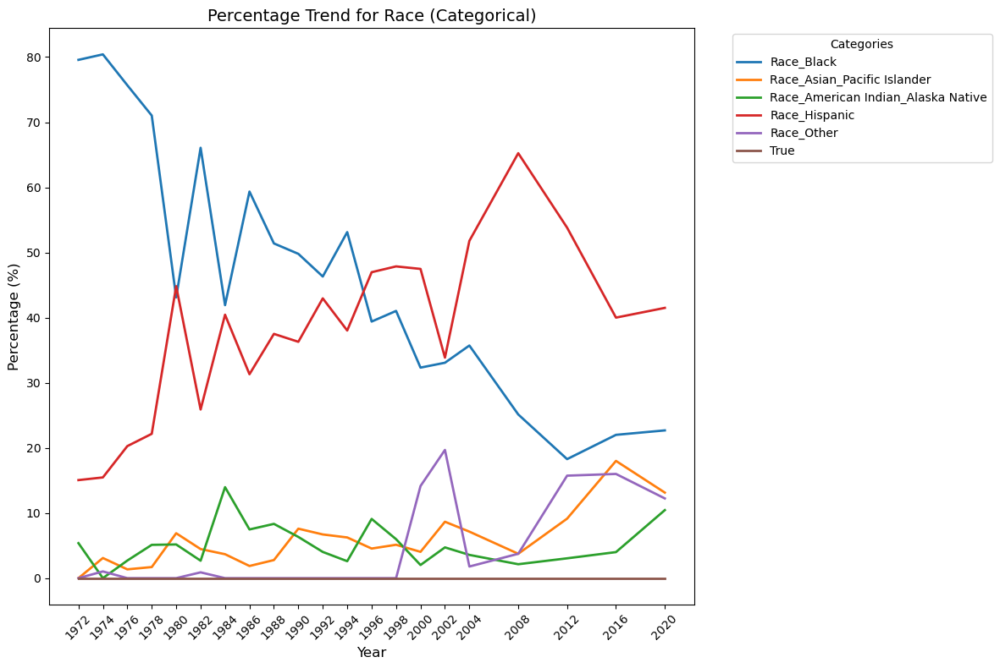

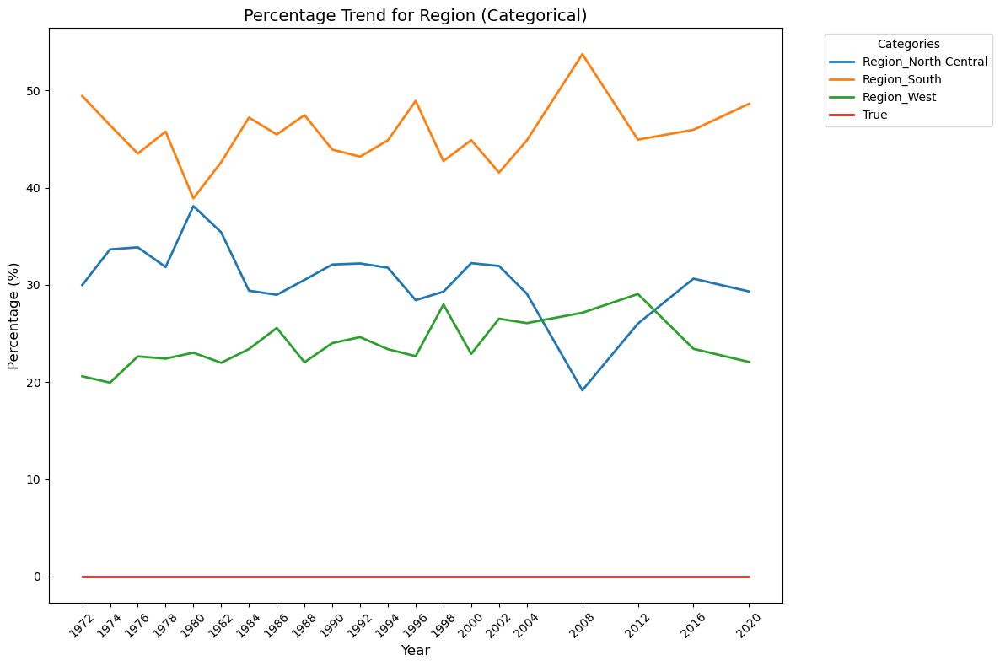

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


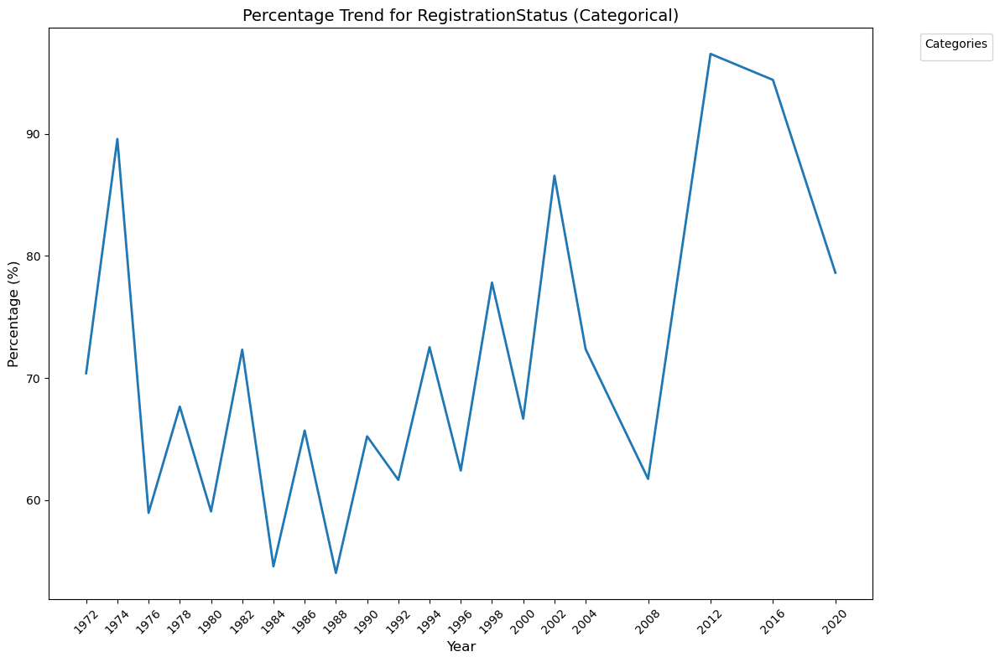

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


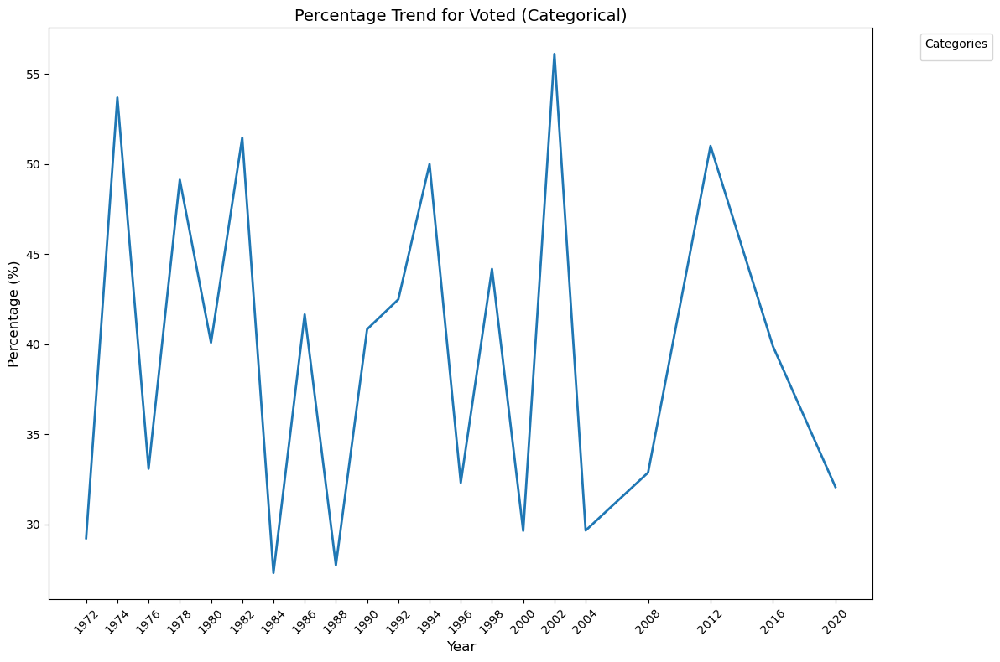

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


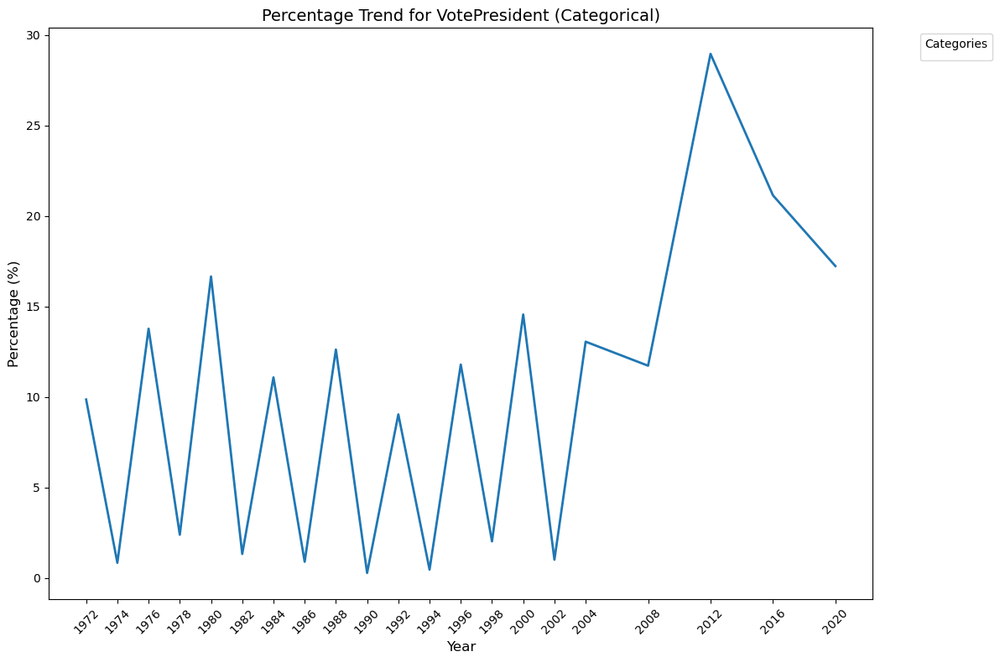

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


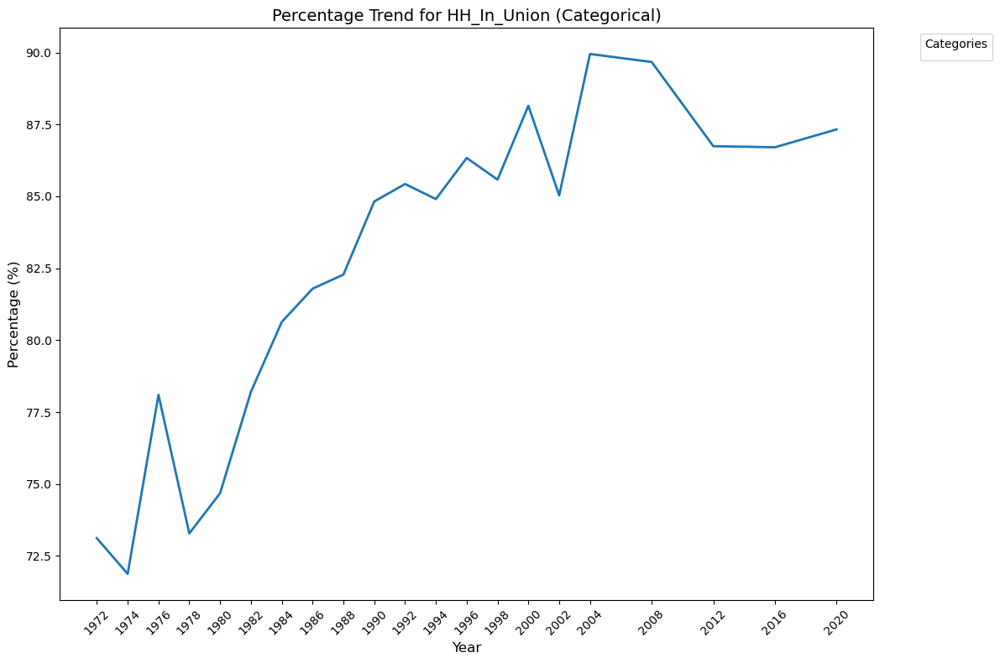

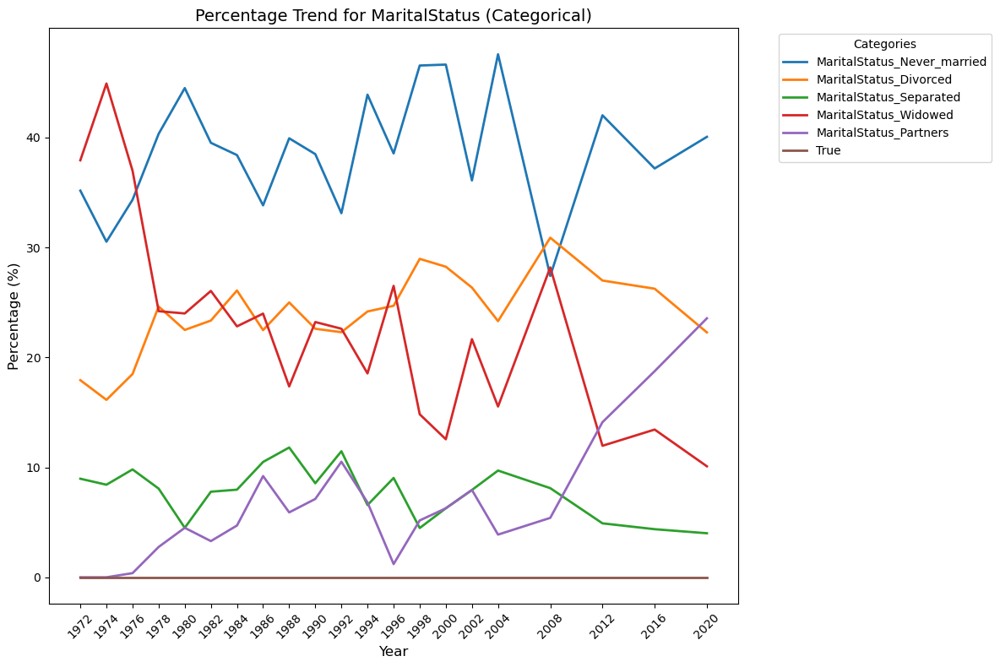

In [5]:
analyze_trends(train_time_data, dict_time_series, True)

In [2]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

def analyze_difference_trends(df, dict_time_series, swing_voter_filter=False): 
    """
    Analyze the difference in trends between overall voters and swing voters for each column,
    focusing only on the differences. For multi-category trends, each category has its own line.

    Parameters:
        df (pd.DataFrame): Input DataFrame with the data.
        dict_time_series (pd.DataFrame): DataFrame defining columns and their types.
        swing_voter_filter (bool): Whether to filter for swing voters or not. Defaults to False.

    Returns:
        None: Visualizes the difference in trends between swing voters and overall population over time.
    """
    # Ensure the "Year" column exists for grouping
    time_column = dict_time_series.loc["VCF0004"]["column"]  # "Year"
    if time_column not in df.columns:
        raise ValueError(f"Time column '{time_column}' not found in DataFrame.")
        
    # Get the unique years for the x-axis limits
    unique_years = sorted(df[time_column].unique())

    # Standardized plot size (width, height) in inches
    plot_width = 12
    plot_height = 8

    # Define a color palette for categories (using seaborn's color palette)
    color_palette = sns.color_palette("Set2")  # Choose a color palette

    # Iterate over each row in the DataFrame (i.e., the metadata for each entry)
    for idx, row in dict_time_series.iterrows():
        column_name = row["column"]
        column_type = row["type"]

        # Skip the time column itself
        if column_name == time_column:
            continue

        if column_type == "cat":
            # Handle categorical (one-hot encoded) columns
            category_prefix = column_name  # Prefix for one-hot encoding
            matching_columns = [col for col in df.columns if col.startswith(category_prefix)]

            if not matching_columns:
                print(f"No one-hot encoded columns found for '{column_name}'.")
                continue

            # Function to calculate the trend for both overall and swing voters
            def calculate_trend(data):
                if len(matching_columns) == 1:
                    # No need to normalize since there is only one category (True/False)
                    trend = data.groupby(time_column)[matching_columns[0]].sum()
                    trend_percentage = (trend / data.groupby(time_column).size()) * 100
                else:
                    # Aggregate one-hot encoded columns by year as percentages
                    trend = data.groupby(time_column)[matching_columns].sum()

                    # Normalize to percentages (considering all categories)
                    trend_percentage = trend.div(trend.sum(axis=1), axis=0) * 100

                return trend_percentage

            # Calculate trends for overall and swing voters
            overall_trend_percentage = calculate_trend(df)  # Overall trend
            swing_voter_trend_percentage = calculate_trend(df[df['swing_voter'] == True])  # Swing voter trend

            # Calculate the difference between the two trends
            trend_difference = swing_voter_trend_percentage - overall_trend_percentage

            # Plotting the difference between trends for both overall and swing voters
            plt.figure(figsize=(plot_width, plot_height))

            # If we have multiple categories, plot the difference for each category
            if isinstance(overall_trend_percentage, pd.DataFrame):
                for idx, category in enumerate(overall_trend_percentage.columns):
                    # Plot the difference for each category
                    plt.plot(trend_difference.index, trend_difference[category], 
                             label=f'Difference for {category}', color=color_palette[idx], linewidth=2)
            else:
                # If there's only one category, just plot the single difference
                plt.plot(trend_difference.index, trend_difference, 
                         label=f'Difference for {matching_columns[0]}', color=color_palette[0], linewidth=2)

            # Draw a horizontal line at 0 to indicate the neutral line
            plt.axhline(0, color='black', linestyle='--', linewidth=1)

            # Plot customization
            plt.title(f"Difference in Trend for {column_name} (Swing Voter vs. Overall)", fontsize=14)
            plt.xlabel("Year", fontsize=12)
            plt.ylabel("Difference in Percentage (%)", fontsize=12)
            plt.xticks(unique_years, rotation=45, fontsize=10)  # Consistent x-axis labels
            plt.yticks(fontsize=10)
            plt.legend(title="Categories", loc="upper left", fontsize=10)
            plt.tight_layout()  # Adjust layout to prevent overlap
            plt.show()

        elif column_type in ["num", "rank"]:
            # Handle numerical columns (e.g., average values, ranks)
            def calculate_numeric_trend(data):
                # Group by time and compute the mean for the numerical column
                return data.groupby(time_column)[column_name].mean()

            # Calculate trends for overall and swing voters
            overall_trend = calculate_numeric_trend(df)  # Overall trend
            swing_voter_trend = calculate_numeric_trend(df[df['swing_voter'] == True])  # Swing voter trend

            # Calculate the difference between the two trends
            trend_difference = swing_voter_trend - overall_trend

            # Plotting the difference between trends for numerical data
            plt.figure(figsize=(plot_width, plot_height))
            plt.plot(trend_difference.index, trend_difference, label="Trend Difference", 
                     color=color_palette[0], linewidth=2)

            # Draw a horizontal line at 0 to indicate the neutral line
            plt.axhline(0, color='black', linestyle='--', linewidth=1)

            # Plot customization
            plt.title(f"Difference in Trend for {column_name} (Swing Voter vs. Overall)", fontsize=14)
            plt.xlabel("Year", fontsize=12)
            plt.ylabel("Difference in Value", fontsize=12)
            plt.xticks(unique_years, rotation=45, fontsize=10)  # Consistent x-axis labels
            plt.yticks(fontsize=10)
            plt.legend(loc="upper left", fontsize=10)
            plt.tight_layout()  # Adjust layout to prevent overlap
            plt.show()

        else:
            print(f"Unsupported column type '{column_type}' for column '{column_name}'.")


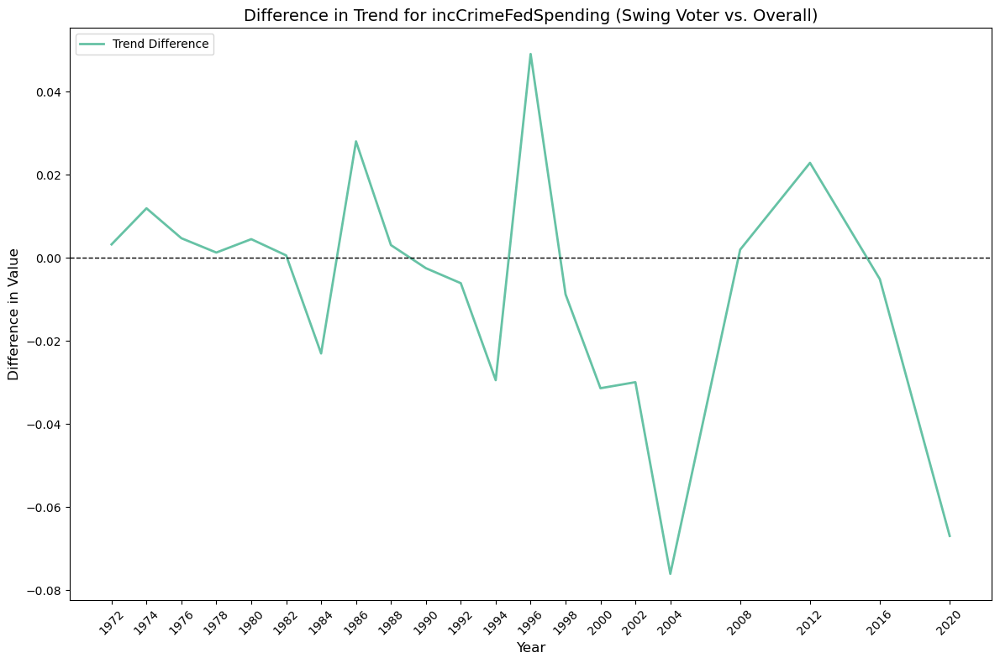

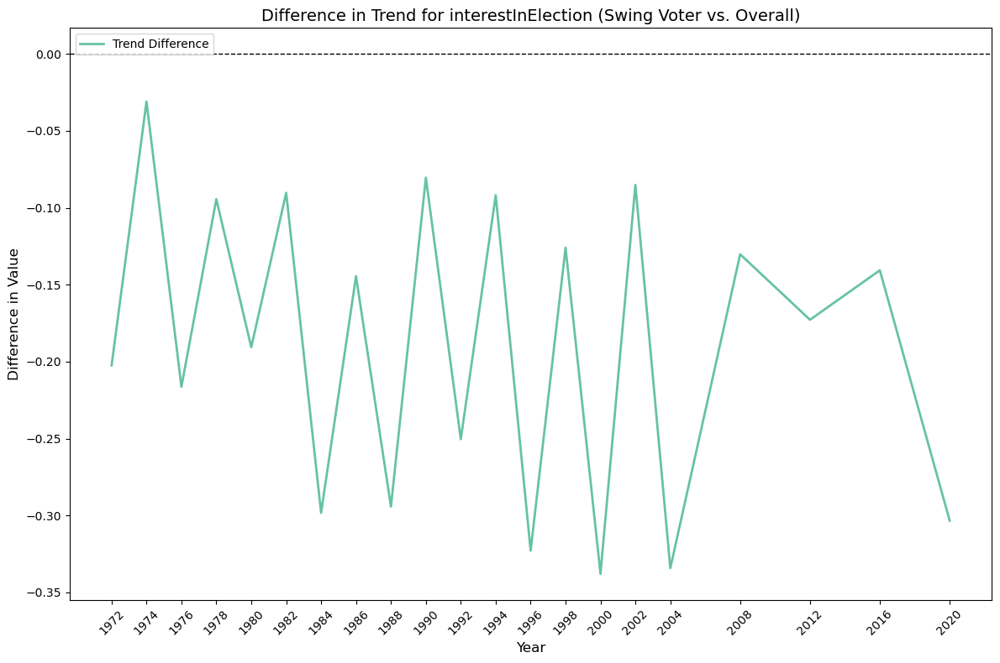

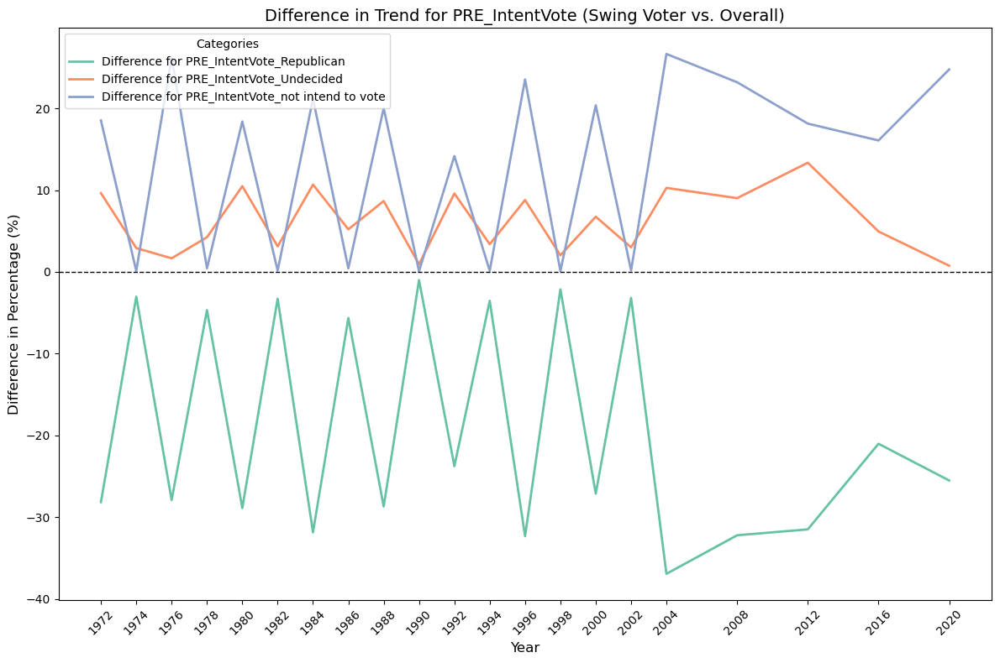

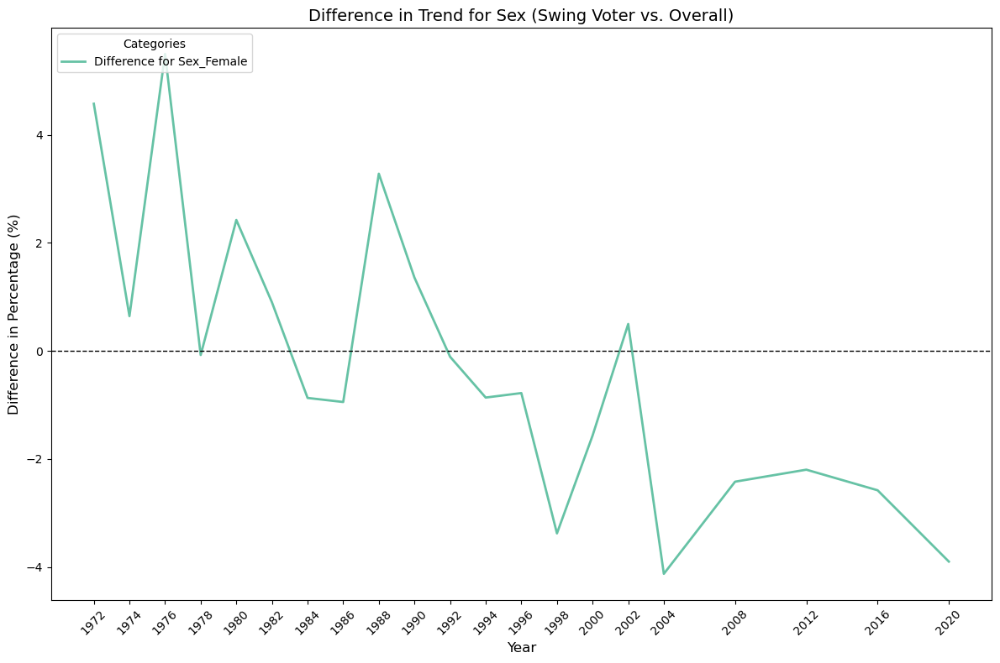

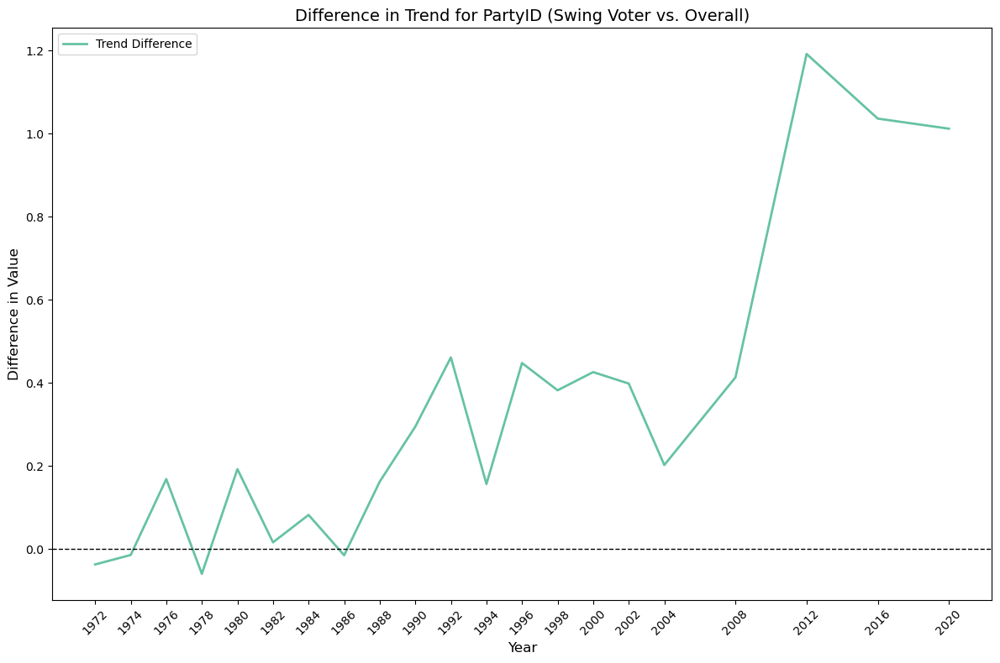

...

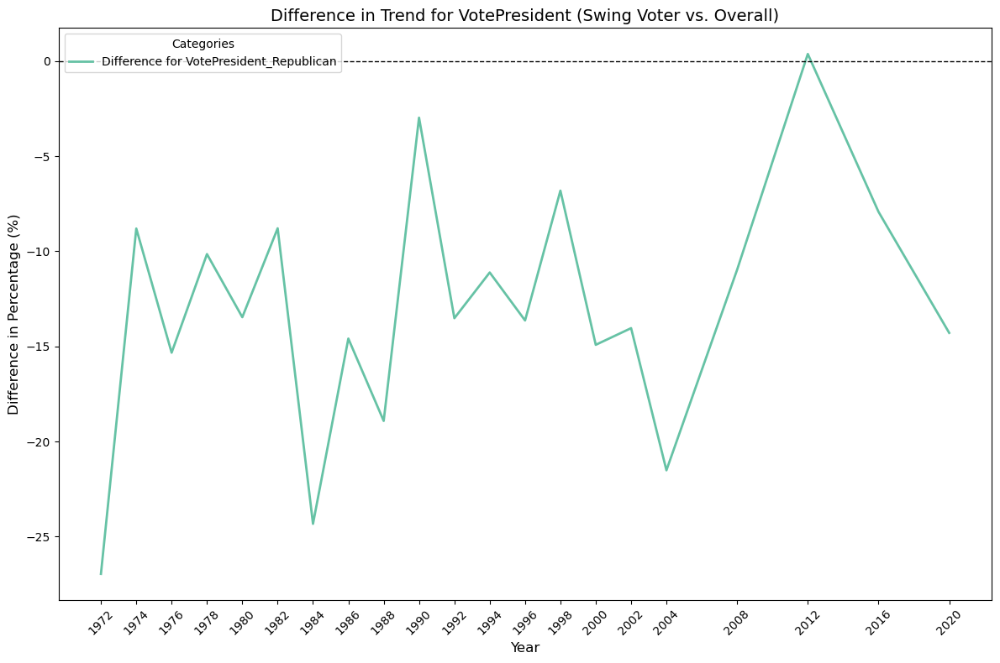

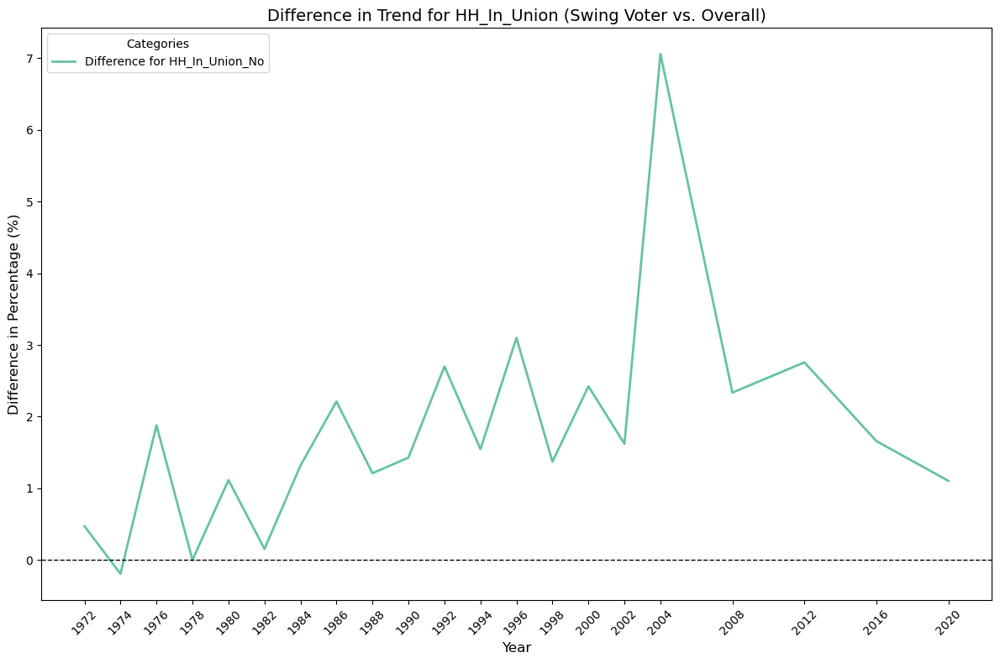

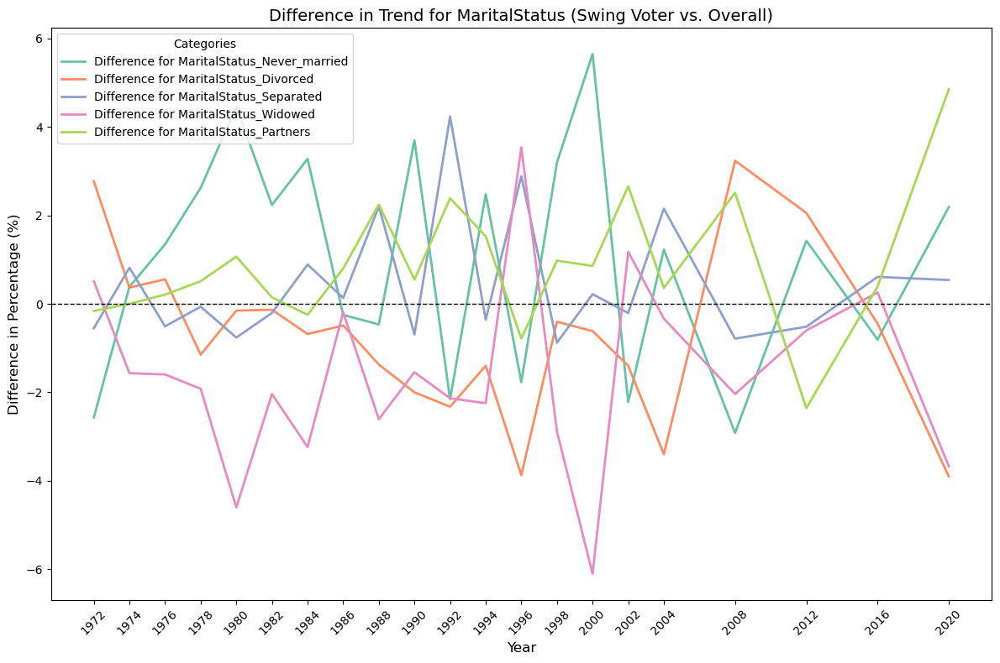

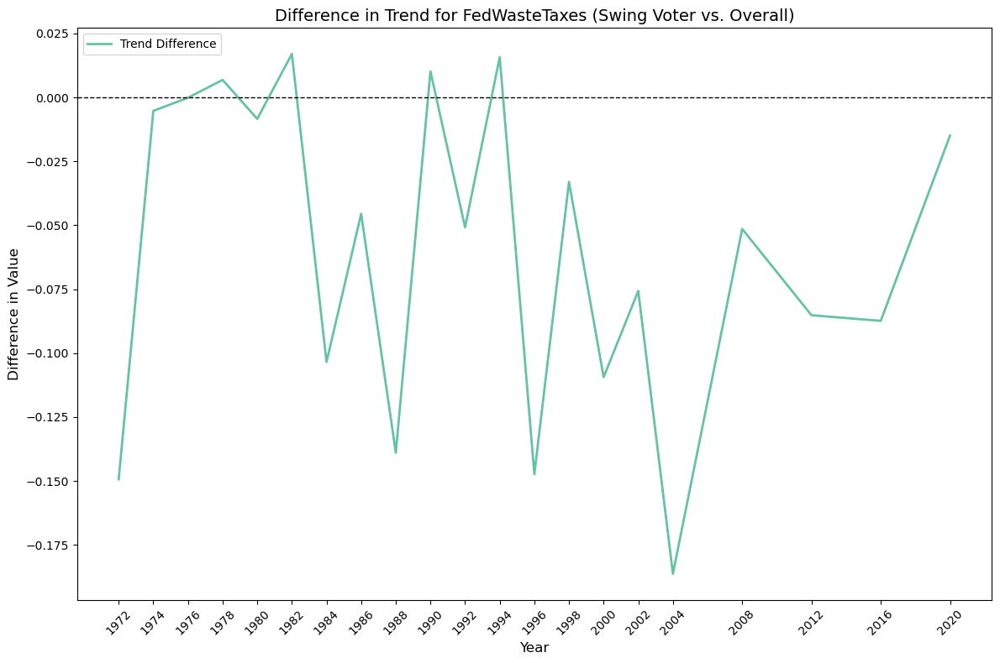

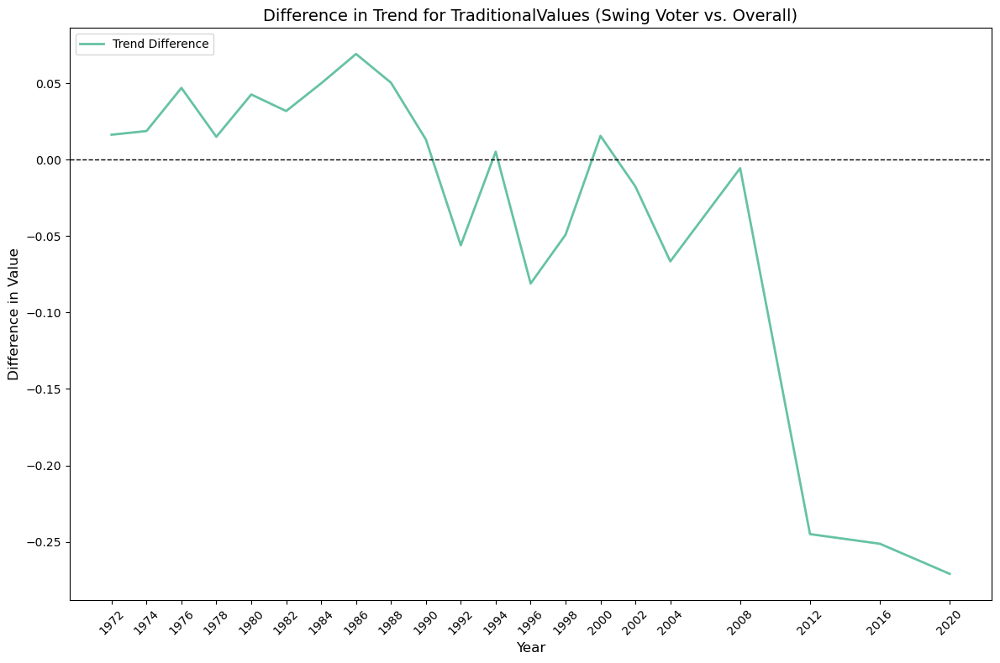

In [3]:
analyze_difference_trends(train_time_data, dict_time_series, True)

In [8]:
def analyze_difference_trends_loess(df, dict_time_series, swing_voter_filter=False, smoothing_frac=0.3):
    """
    Analyze the smoothed difference in trends using LOESS between overall voters and swing voters for each column.

    Parameters:
        df (pd.DataFrame): Input DataFrame with the data.
        dict_time_series (pd.DataFrame): DataFrame defining columns and their types.
        swing_voter_filter (bool): Whether to filter for swing voters or not. Defaults to False.
        smoothing_frac (float): Fraction of the data used for LOESS smoothing.

    Returns:
        None: Visualizes the smoothed difference in trends over time.
    """
    from statsmodels.nonparametric.smoothers_lowess import lowess
    import matplotlib.pyplot as plt
    import seaborn as sns
    import pandas as pd

    # Time column (e.g., "Year") to group by
    time_column = dict_time_series.loc["VCF0004"]["column"]  # "Year"
    if time_column not in df.columns:
        raise ValueError(f"Time column '{time_column}' not found in DataFrame.")

    # Unique years for the x-axis
    unique_years = sorted(df[time_column].unique())

    # Plot settings
    plot_width = 12
    plot_height = 8
    color_palette = sns.color_palette("Set2")

    def apply_loess(data, x_col, frac):
        """Applies LOESS smoothing to a Pandas Series or DataFrame."""
        if isinstance(data, pd.Series):
            smoothed = lowess(data.values, x_col, frac=frac, return_sorted=False)
            return pd.Series(smoothed, index=data.index)
        elif isinstance(data, pd.DataFrame):
            return data.apply(lambda col: pd.Series(
                lowess(col.values, x_col, frac=frac, return_sorted=False), 
                index=data.index
            ))
        else:
            raise ValueError("Input to LOESS must be a Pandas Series or DataFrame.")

    for idx, row in dict_time_series.iterrows():
        column_name = row["column"]
        column_type = row["type"]

        # Skip the time column itself
        if column_name == time_column:
            continue

        if column_type == "cat":
            # Handle categorical (one-hot encoded) data
            category_prefix = column_name
            matching_columns = [col for col in df.columns if col.startswith(category_prefix)]

            if not matching_columns:
                print(f"No one-hot encoded columns found for '{column_name}'.")
                continue

            def calculate_trend(data):
                if len(matching_columns) == 1:
                    trend = data.groupby(time_column)[matching_columns[0]].sum()
                    trend_percentage = (trend / data.groupby(time_column).size()) * 100
                else:
                    trend = data.groupby(time_column)[matching_columns].sum()
                    trend_percentage = trend.div(trend.sum(axis=1), axis=0) * 100
                return trend_percentage

            overall_trend_percentage = calculate_trend(df)
            swing_voter_trend_percentage = calculate_trend(df[df['swing_voter'] == True])
            trend_difference = swing_voter_trend_percentage - overall_trend_percentage

        elif column_type in ["num", "rank"]:
            # Handle numerical or rank data
            def calculate_trend(data):
                return data.groupby(time_column)[column_name].mean()

            overall_trend = calculate_trend(df)
            swing_voter_trend = calculate_trend(df[df['swing_voter'] == True])
            trend_difference = swing_voter_trend - overall_trend

        else:
            print(f"Unsupported column type '{column_type}' for '{column_name}'.")
            continue

        # Apply LOESS smoothing to the trend difference
        smoothed_difference = apply_loess(trend_difference, trend_difference.index, smoothing_frac)

        # Plotting the smoothed difference
        plt.figure(figsize=(plot_width, plot_height))
        if isinstance(smoothed_difference, pd.DataFrame):
            for idx, category in enumerate(smoothed_difference.columns):
                plt.plot(smoothed_difference.index, smoothed_difference[category],
                         label=f'Smoothed Difference for {category}',
                         color=color_palette[idx % len(color_palette)], linewidth=2)
        else:
            plt.plot(smoothed_difference.index, smoothed_difference,
                     label=f'Smoothed Difference for {column_name}',
                     color=color_palette[0], linewidth=2)

        plt.axhline(0, color='black', linestyle='--', linewidth=1)
        plt.title(f"Smoothed Difference in Trend for {column_name} (Swing Voter vs. Overall)", fontsize=14)
        plt.xlabel("Year", fontsize=12)
        plt.ylabel(f"Smoothed Difference in {'Percentage (%)' if column_type == 'cat' else 'Value'}", fontsize=12)
        plt.xticks(unique_years, rotation=45, fontsize=10)
        plt.yticks(fontsize=10)
        plt.legend(loc="upper left", fontsize=10)
        plt.tight_layout()
        plt.show()

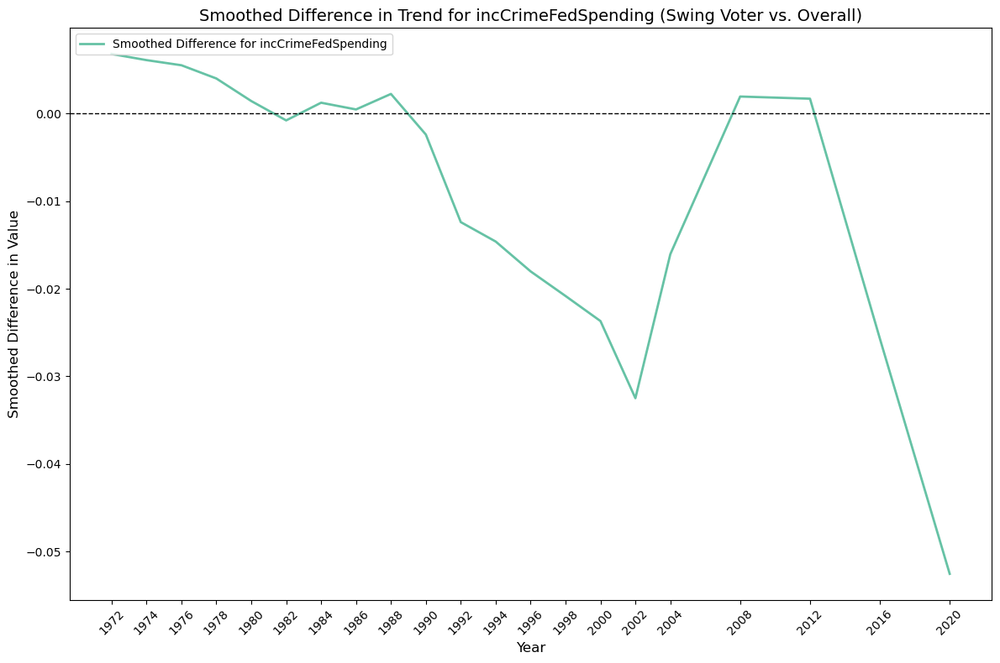

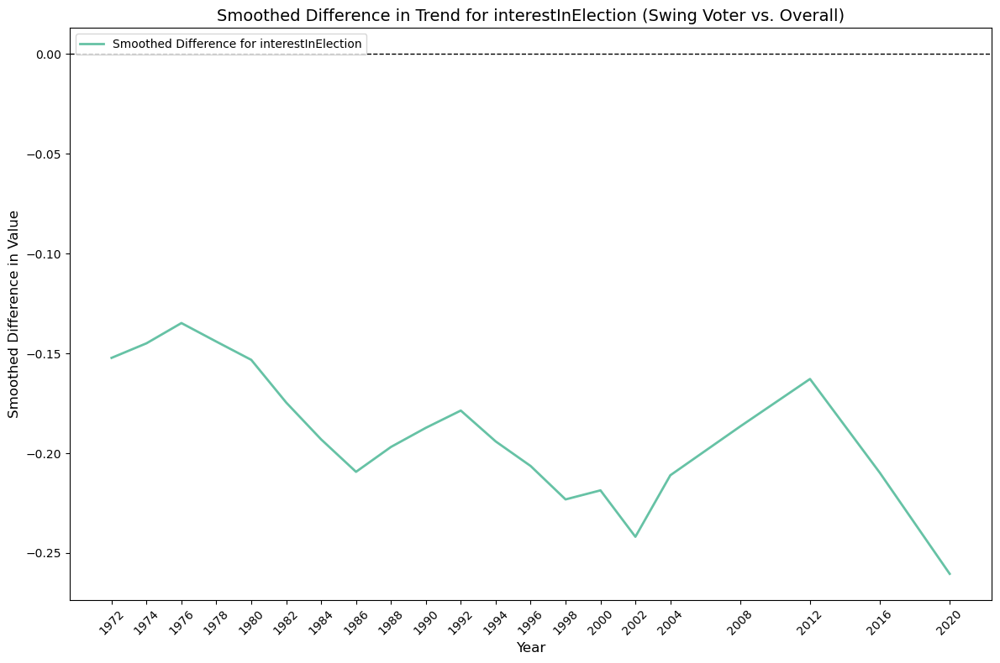

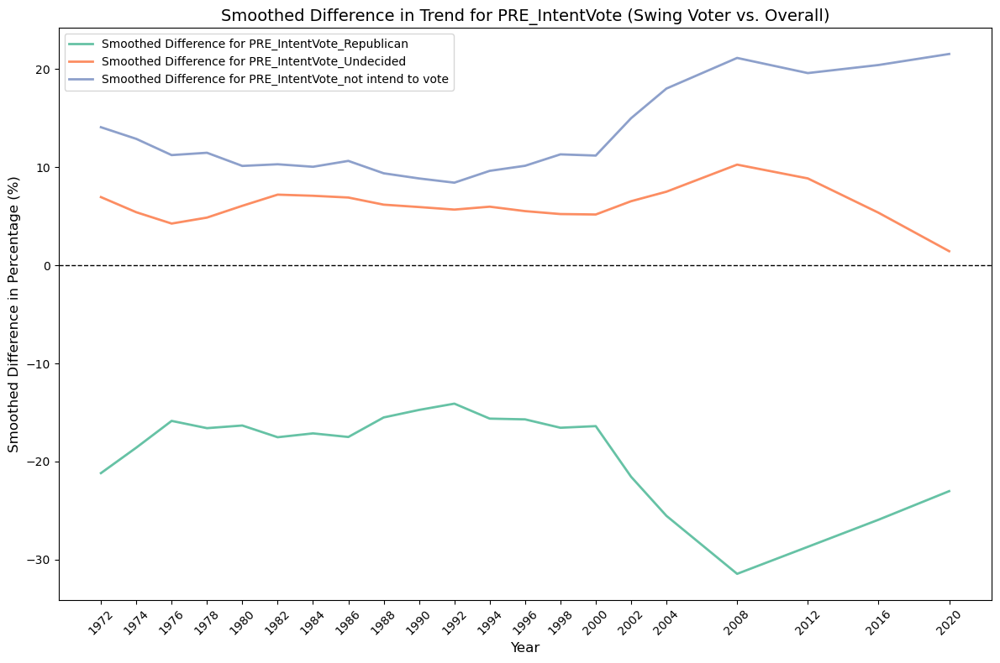

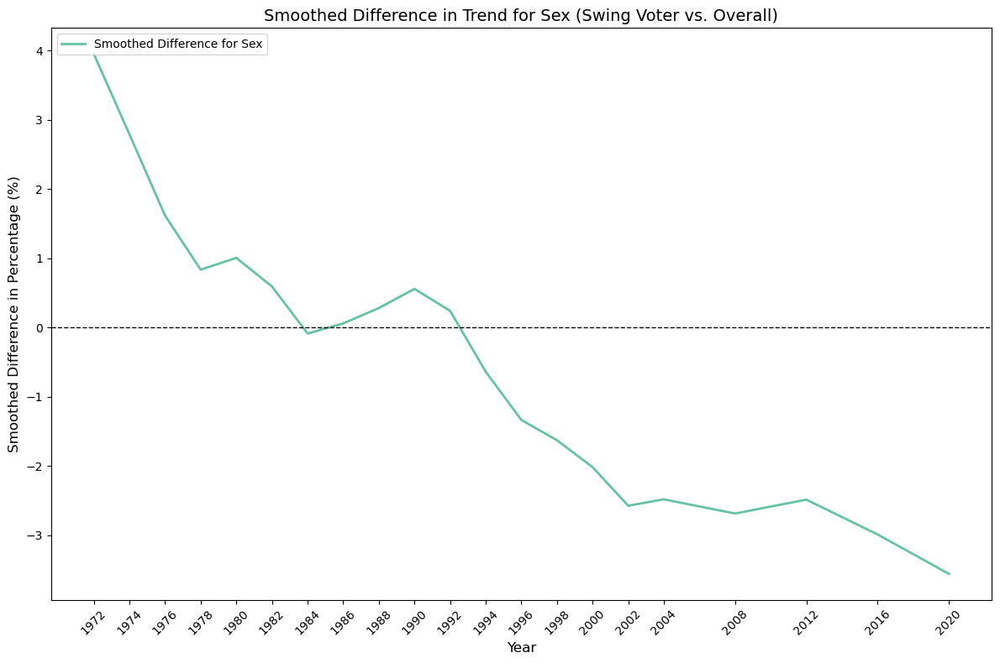

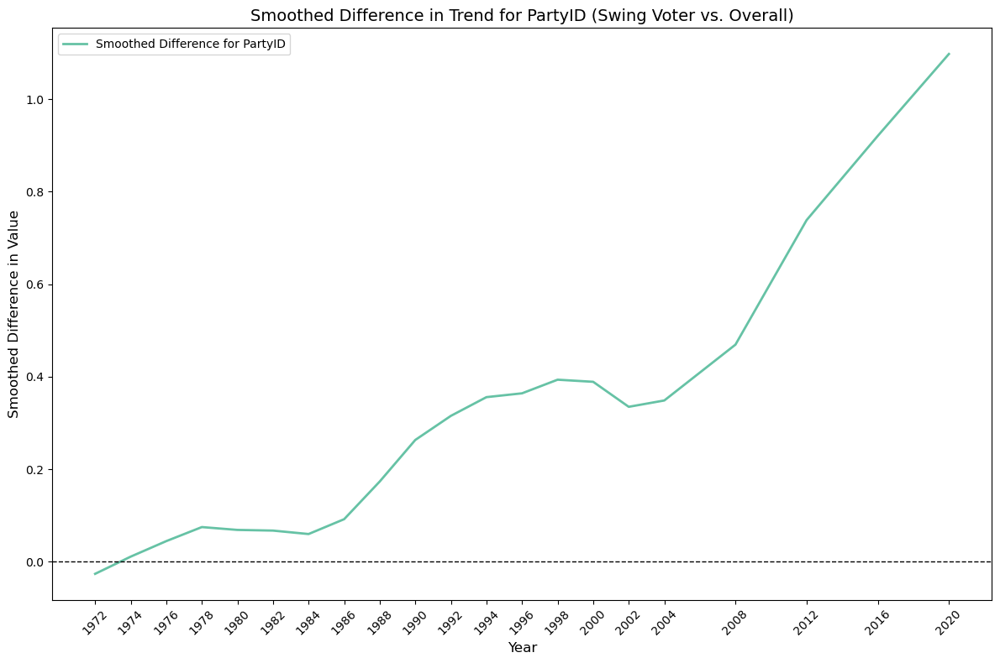

...

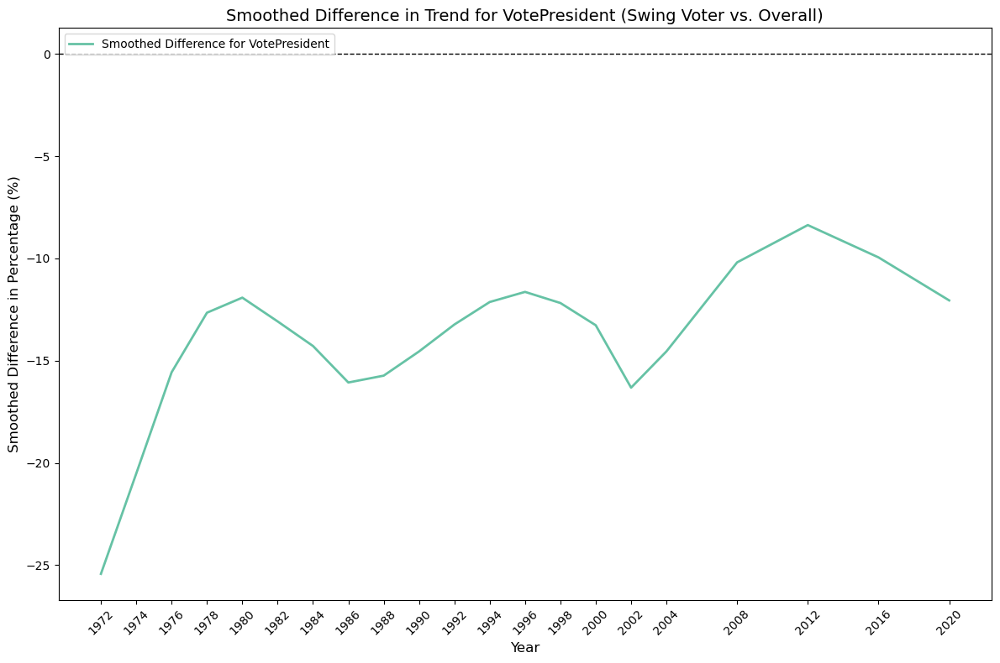

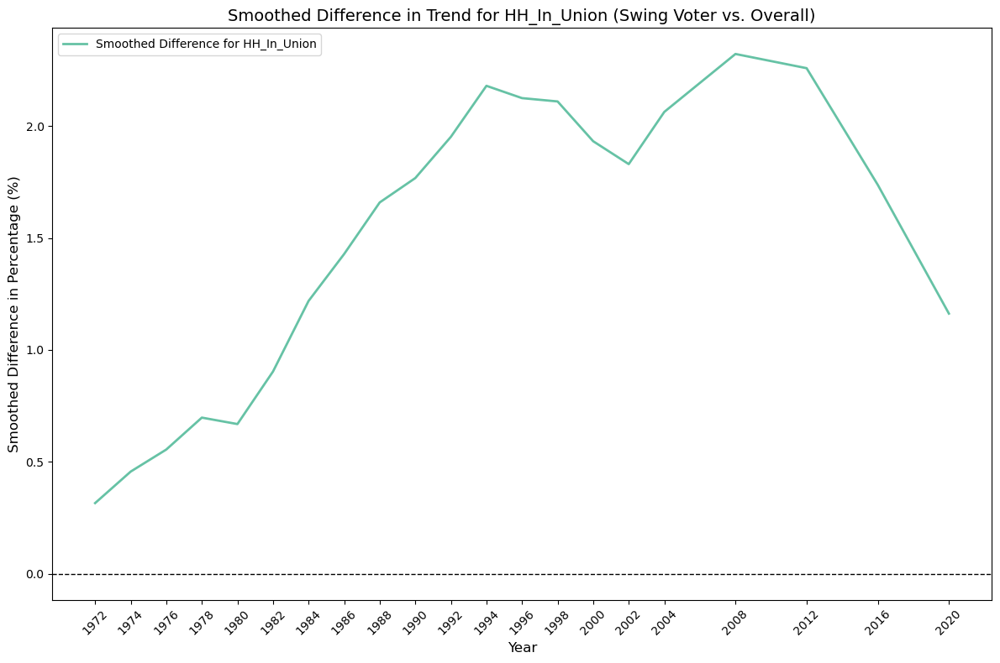

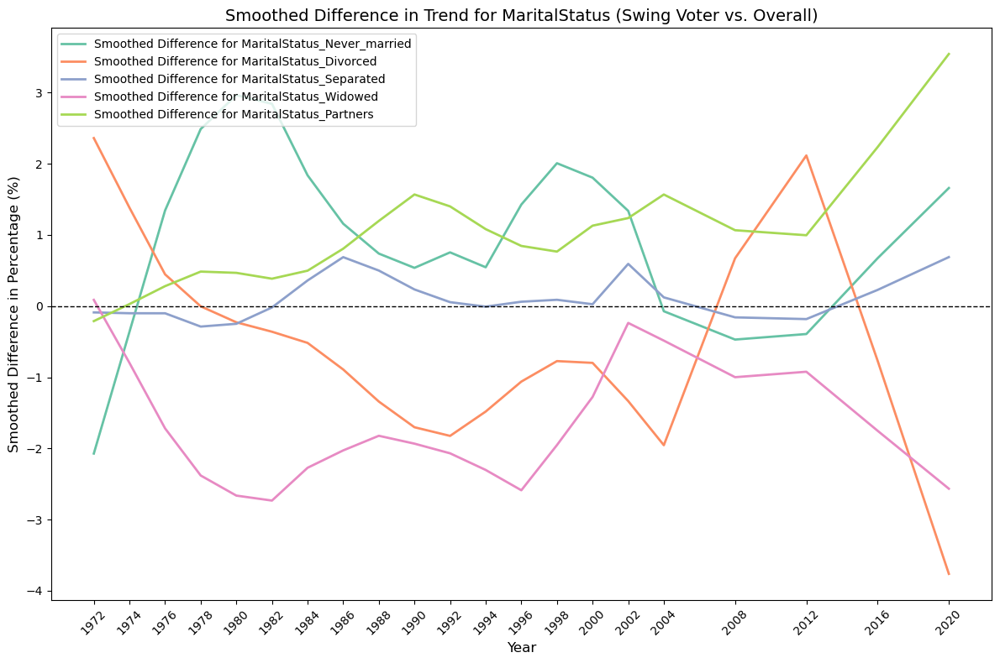

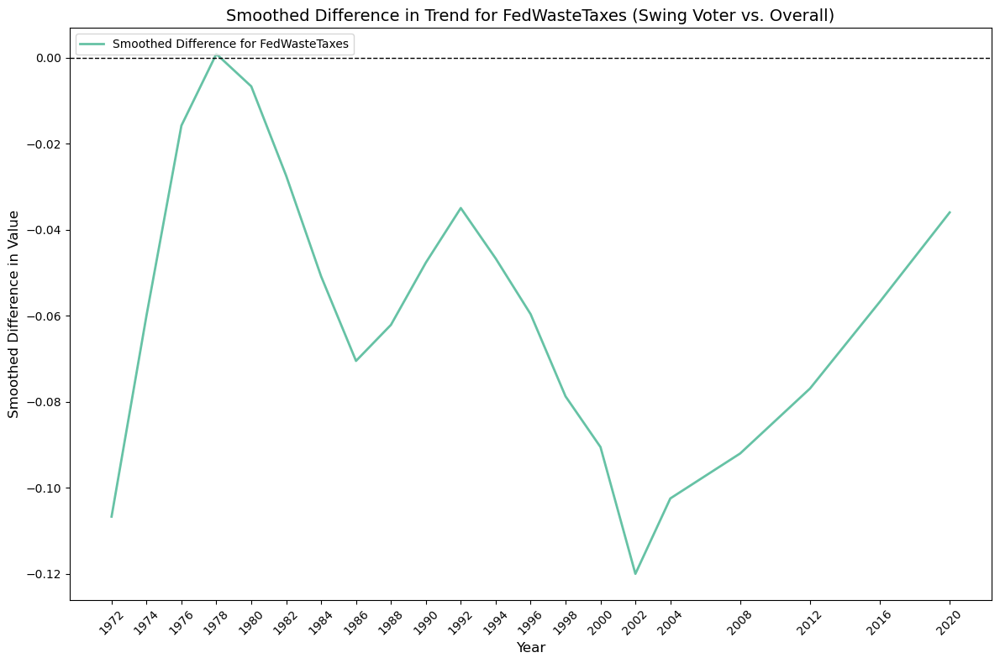

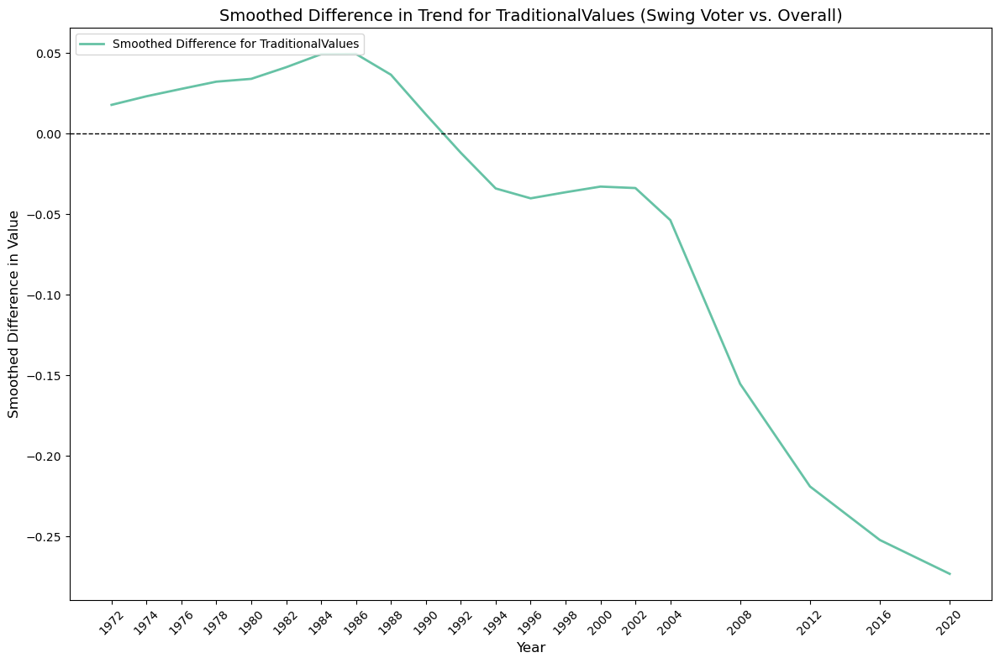

In [9]:
analyze_difference_trends_loess(train_time_data, dict_time_series, swing_voter_filter=True, smoothing_frac=0.3)

# Model Evaluation

In [39]:
for col in X_train_time:
    if col not in X_test_2020_time:
        print(col)
        
for col in X_test_2020_time:
    if col not in X_train_time:
        print(col)

illegalAliens
EasierBuyGun
PRE_IntentVote_Republican
PRE_IntentVote_Undecided
PRE_IntentVote_not intend to vote


In [67]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from sklearn.linear_model import LogisticRegression, Ridge, Lasso
from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.preprocessing import OneHotEncoder, scale, StandardScaler
import statsmodels.api as sm
from itertools import product
from joblib import Parallel, delayed
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from imblearn.over_sampling import SMOTE

from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

# Select features to normalize (e.g., numerical columns only)
numerical_features = [dict_time_series.loc[col]["column"] for col in dict_time_series.index if dict_time_series.loc[col]["type"] == "rank" or dict_time_series.loc[col]["type"] == "num"]

train_time_data_scaled = train_time_data
val_time_data_scaled = val_time_data
test_time_data_scaled = test_time_data
test_2020_data_scaled = test_2020_data

train_time_data_scaled[numerical_features] = scaler.fit_transform(train_time_data[numerical_features])
val_time_data_scaled[numerical_features] = scaler.transform(val_time_data[numerical_features])
test_time_data_scaled[numerical_features] = scaler.transform(test_time_data[numerical_features])
test_2020_data_scaled[numerical_features] = scaler.transform(test_2020_data[numerical_features])

y_train_time = train_time_data_scaled['swing_voter']
X_train_time = train_time_data_scaled.drop(['RegistrationStatus_Yes', 'Voted_Yes',
       'VotePresident_Republican', 'PRE_IntentVote_Republican',
       'PRE_IntentVote_Undecided', 'PRE_IntentVote_not intend to vote',
        'swing_voter'],axis=1)

y_val_time = val_time_data_scaled['swing_voter']
X_val_time = val_time_data_scaled.drop(['RegistrationStatus_Yes', 'Voted_Yes',
       'VotePresident_Republican', 'PRE_IntentVote_Republican',
       'PRE_IntentVote_Undecided', 'PRE_IntentVote_not intend to vote',
        'swing_voter'],axis=1)

y_test_time = test_time_data_scaled['swing_voter']
X_test_time = test_time_data_scaled.drop(['RegistrationStatus_Yes', 'Voted_Yes',
       'VotePresident_Republican', 'PRE_IntentVote_Republican',
       'PRE_IntentVote_Undecided', 'PRE_IntentVote_not intend to vote',
        'swing_voter'],axis=1)

y_test_2020_time = test_2020_data_scaled['swing_voter']
X_test_2020_time = test_2020_data_scaled.drop(['RegistrationStatus_Yes',
       'VotePresident_Republican', 'PRE_IntentVote_Republican', 'EasierBuyGun', 'illegalAliens',
       'PRE_IntentVote_Undecided', 'PRE_IntentVote_not intend to vote','swing_voter'],axis=1)
X_test_2020_time['MaritalStatus_Partners'] = False
X_test_2020_time = X_test_2020_time[X_train_time.columns]

model_LG = LogisticRegression(class_weight='balanced', random_state=42, penalty='l2', C=10, solver='liblinear')
model_LG.fit(X=X_train_time,
               y=y_train_time)

val_pred = model_LG.predict(X=X_val_time)
test_pred = model_LG.predict(X=X_test_time)
test_2020_pred = model_LG.predict(X=X_test_2020_time)

In [68]:
print("Validation")
print("Confusion Matrix:\n", confusion_matrix(val_time_data['swing_voter'], val_pred))
print("Accuracy:", accuracy_score(val_time_data['swing_voter'], val_pred))
print("Classification Report:\n", classification_report(val_time_data['swing_voter'], val_pred))

print("Test")
print("Confusion Matrix:\n", confusion_matrix(y_test_time, test_pred))
print("Accuracy:", accuracy_score(y_test_time, test_pred))
print("Classification Report:\n", classification_report(y_test_time, test_pred))

print("Test 2020")
print("Confusion Matrix:\n", confusion_matrix(y_test_2020_time, test_2020_pred))
print("Accuracy:", accuracy_score(y_test_2020_time, test_2020_pred))
print("Classification Report:\n", classification_report(y_test_2020_time, test_2020_pred))

Validation
Confusion Matrix:
 [[3338 1683]
 [ 891 2024]]
Accuracy: 0.6756552419354839
Classification Report:
               precision    recall  f1-score   support

       False       0.79      0.66      0.72      5021
        True       0.55      0.69      0.61      2915

    accuracy                           0.68      7936
   macro avg       0.67      0.68      0.67      7936
weighted avg       0.70      0.68      0.68      7936

Test
Confusion Matrix:
 [[3325 1734]
 [ 881 1997]]
Accuracy: 0.670530427113519
Classification Report:
               precision    recall  f1-score   support

       False       0.79      0.66      0.72      5059
        True       0.54      0.69      0.60      2878

    accuracy                           0.67      7937
   macro avg       0.66      0.68      0.66      7937
weighted avg       0.70      0.67      0.68      7937

Test 2020
Confusion Matrix:
 [[6500 1033]
 [ 658   89]]
Accuracy: 0.7957729468599034
Classification Report:
               precision 

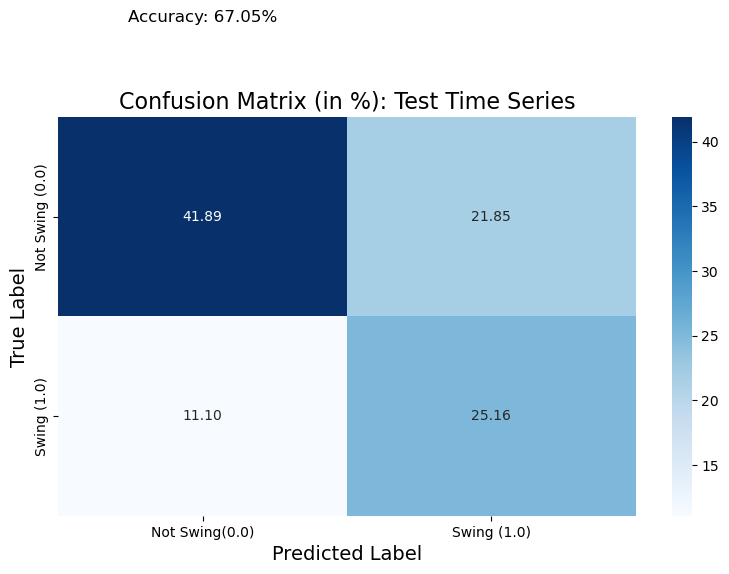

In [69]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate confusion matrix and normalize it to percentages
cm_values = confusion_matrix(y_test_time, test_pred) / y_test_time.shape[0] * 100
#cm_values = confusion_matrix(y_test_2020_time, test_2020_pred) / y_test_2020_time.shape[0] * 100

# Create the confusion matrix plot
plt.figure(figsize=(8, 6))
sns.heatmap(cm_values, annot=True, fmt='.2f', cmap='Blues', 
            xticklabels=['Not Swing(0.0)', 'Swing (1.0)'], 
            yticklabels=['Not Swing (0.0)', 'Swing (1.0)'])

# Set plot labels and title
plt.title('Confusion Matrix (in %): Test Time Series', fontsize=16)
plt.xlabel('Predicted Label', fontsize=14)
plt.ylabel('True Label', fontsize=14)

# Display the accuracy as a percentage
accuracy = (cm_values[0, 0] + cm_values[1, 1])
plt.text(0.5, -0.5, f'Accuracy: {accuracy:.2f}%', fontsize=12, ha='center', va='center', color='black')

# Show the plot
plt.tight_layout()
plt.show()

In [70]:
from catboost import CatBoostClassifier
from sklearn.utils.class_weight import compute_class_weight

classes = np.array([False, True])  # Assuming binary classification
class_weights = compute_class_weight('balanced', classes=classes, y=y_train_time)

# Create the CatBoostClassifier
cat_model = CatBoostClassifier(iterations=1500, 
                           learning_rate=0.1, 
                           depth=8, 
                           class_weights=class_weights,
                              verbose=0)

cat_model.fit(X_train_time, y_train_time)

print("Validation")
# Predict Probabilities
y_val_pred = cat_model.predict(X_val_time)

# Evaluate Performance
conf_matrix = confusion_matrix(y_val_time, y_val_pred)
print(f"Confusion Matrix:\n{conf_matrix}")
print(classification_report(y_val_time, y_val_pred))
print("Accuracy:", accuracy_score(y_val_time, y_val_pred))

print("Test")
# Predict Probabilities
y_test_pred = cat_model.predict(X_test_time)

# Evaluate Performance
conf_matrix = confusion_matrix(y_test_time, y_test_pred)
print(f"Confusion Matrix:\n{conf_matrix}")
print(classification_report(y_test_time, y_test_pred))
print("Accuracy:", accuracy_score(y_test_time, y_test_pred))

print("Test 2020")
# Predict Probabilities
y_test_2020_pred = cat_model.predict(X_test_2020_time)

# Evaluate Performance
conf_matrix = confusion_matrix(y_test_2020_time, y_test_2020_pred)
print(f"Confusion Matrix:\n{conf_matrix}")
print(classification_report(y_test_2020_time, y_test_2020_pred))
print("Accuracy:", accuracy_score(y_test_2020_time, y_test_2020_pred))

Validation
Confusion Matrix:
[[3987 1034]
 [1047 1868]]
              precision    recall  f1-score   support

       False       0.79      0.79      0.79      5021
        True       0.64      0.64      0.64      2915

    accuracy                           0.74      7936
   macro avg       0.72      0.72      0.72      7936
weighted avg       0.74      0.74      0.74      7936

Accuracy: 0.7377772177419355
Test
Confusion Matrix:
[[4030 1029]
 [1003 1875]]
              precision    recall  f1-score   support

       False       0.80      0.80      0.80      5059
        True       0.65      0.65      0.65      2878

    accuracy                           0.74      7937
   macro avg       0.72      0.72      0.72      7937
weighted avg       0.74      0.74      0.74      7937

Accuracy: 0.743983872999874
Test 2020
Confusion Matrix:
[[6608  925]
 [ 507  240]]
              precision    recall  f1-score   support

       False       0.93      0.88      0.90      7533
        True       

In [53]:
# Check class distribution in the training data
print(y_train_time.value_counts()/len(y_train_time))
print(y_test_2020_time.value_counts()/len(y_test_2020_time))

swing_voter
False    0.638531
True     0.361469
Name: count, dtype: float64
swing_voter
False    0.909783
True     0.090217
Name: count, dtype: float64


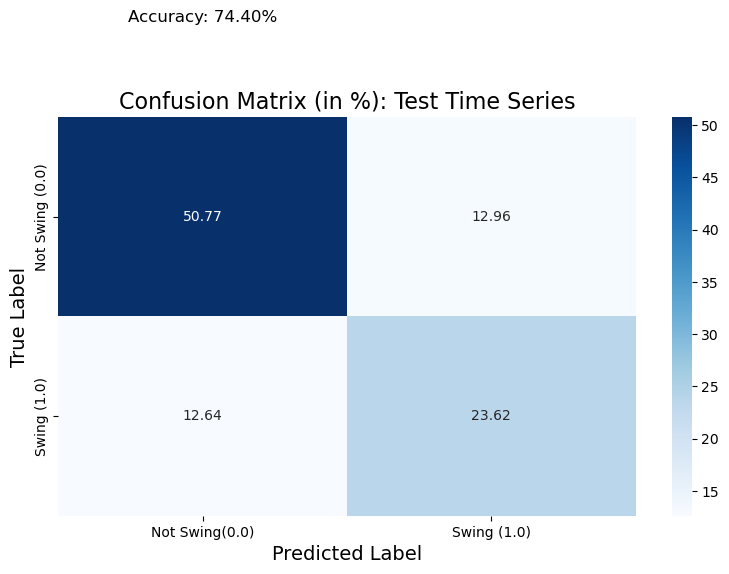

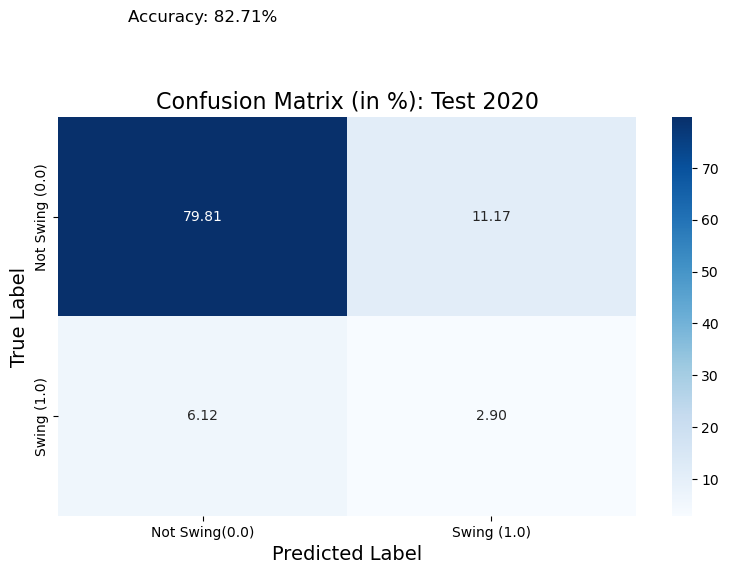

In [71]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate confusion matrix and normalize it to percentages
cm_values = confusion_matrix(y_test_time, y_test_pred) / y_test_time.shape[0] * 100
cm_values_2020 = confusion_matrix(y_test_2020_time, y_test_2020_pred) / y_test_2020_time.shape[0] * 100

# Create the confusion matrix plot
plt.figure(figsize=(8, 6))
sns.heatmap(cm_values, annot=True, fmt='.2f', cmap='Blues', 
            xticklabels=['Not Swing(0.0)', 'Swing (1.0)'], 
            yticklabels=['Not Swing (0.0)', 'Swing (1.0)'])

# Set plot labels and title
plt.title('Confusion Matrix (in %): Test Time Series', fontsize=16)
plt.xlabel('Predicted Label', fontsize=14)
plt.ylabel('True Label', fontsize=14)

# Display the accuracy as a percentage
accuracy = (cm_values[0, 0] + cm_values[1, 1])
plt.text(0.5, -0.5, f'Accuracy: {accuracy:.2f}%', fontsize=12, ha='center', va='center', color='black')

# Show the plot
plt.tight_layout()
plt.show()


plt.figure(figsize=(8, 6))
sns.heatmap(cm_values_2020, annot=True, fmt='.2f', cmap='Blues', 
            xticklabels=['Not Swing(0.0)', 'Swing (1.0)'], 
            yticklabels=['Not Swing (0.0)', 'Swing (1.0)'])

# Set plot labels and title
plt.title('Confusion Matrix (in %): Test 2020', fontsize=16)
plt.xlabel('Predicted Label', fontsize=14)
plt.ylabel('True Label', fontsize=14)

# Display the accuracy as a percentage
accuracy = (cm_values_2020[0, 0] + cm_values_2020[1, 1])
plt.text(0.5, -0.5, f'Accuracy: {accuracy:.2f}%', fontsize=12, ha='center', va='center', color='black')

# Show the plot
plt.tight_layout()
plt.show()

# Swap Train and Test

In [72]:
from catboost import CatBoostClassifier
from sklearn.utils.class_weight import compute_class_weight

classes = np.array([False, True])  # Assuming binary classification
class_weights = compute_class_weight('balanced', classes=classes, y=y_train_time)

# Create the CatBoostClassifier
cat_model = CatBoostClassifier(iterations=1500, 
                           learning_rate=0.1, 
                           depth=8, 
                           class_weights=class_weights,
                              verbose=0)

cat_model.fit(X_test_2020_time, y_test_2020_pred)

print("Train Time Series")
# Predict Probabilities
y_train_pred = cat_model.predict(X_train_time)

# Evaluate Performance
conf_matrix = confusion_matrix(y_train_time, y_train_pred)
print(f"Confusion Matrix:\n{conf_matrix}")
print(classification_report(y_train_time, y_train_pred))
print("Accuracy:", accuracy_score(y_train_time, y_train_pred))



Train Time Series
Confusion Matrix:
[[22263  1385]
 [10366  3021]]
              precision    recall  f1-score   support

       False       0.68      0.94      0.79     23648
        True       0.69      0.23      0.34     13387

    accuracy                           0.68     37035
   macro avg       0.68      0.58      0.57     37035
weighted avg       0.68      0.68      0.63     37035

Accuracy: 0.6827055488051843


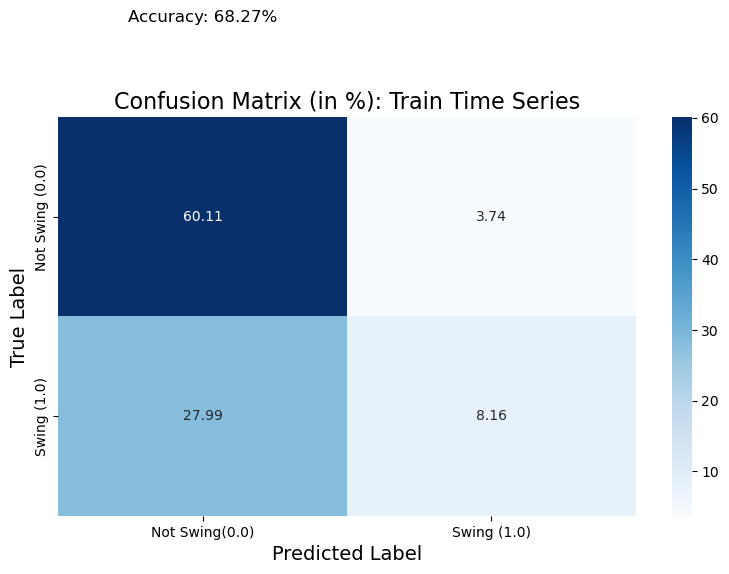

In [73]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate confusion matrix and normalize it to percentages
cm_values = confusion_matrix(y_train_time, y_train_pred) / y_train_time.shape[0] * 100

# Create the confusion matrix plot
plt.figure(figsize=(8, 6))
sns.heatmap(cm_values, annot=True, fmt='.2f', cmap='Blues', 
            xticklabels=['Not Swing(0.0)', 'Swing (1.0)'], 
            yticklabels=['Not Swing (0.0)', 'Swing (1.0)'])

# Set plot labels and title
plt.title('Confusion Matrix (in %): Train Time Series', fontsize=16)
plt.xlabel('Predicted Label', fontsize=14)
plt.ylabel('True Label', fontsize=14)

# Display the accuracy as a percentage
accuracy = (cm_values[0, 0] + cm_values[1, 1])
plt.text(0.5, -0.5, f'Accuracy: {accuracy:.2f}%', fontsize=12, ha='center', va='center', color='black')

# Show the plot
plt.tight_layout()
plt.show()

# Stability Testing of Models/Data

In [54]:
import importlib
# Import the function
from functions import explore_data_helper

# Reload the module to reflect any updates
importlib.reload(explore_data_helper)

df_temp = X_train_time
df_temp['swing_voter'] = y_train_time

perturbed_data = [explore_data_helper.perturb_dataframe(df_temp) for i in range(100)]

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[1.0746553  2.18638975 2.24997633 ... 1.90394594 0.83124494 0.85741212]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[0.64465317 2.33583986 2.93314826 ... 0.65657074 2.76903606 1.21285942]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Docu

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[2.1085866  0.77859694 1.26571526 ... 1.90767245 2.25839958 1.17859781]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[3.35540259 2.71219546 0.30178013 ... 2.03537165 1.66908065 0.90088901]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Docu

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[2.27501076 0.7504911  1.71053502 ... 3.21992073 1.27959475 0.87985534]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[2.91885842 3.03398827 1.69779853 ... 1.87724226 0.76724443 2.76204021]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Docu

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[2.26484455 1.19676859 0.75261796 ... 2.92870135 0.77807998 1.77566681]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[2.33336554 1.14031248 1.22083298 ... 2.21624247 0.14226636 1.24522513]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Docu

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[1.86202832 2.28601559 1.09509876 ... 1.10231121 1.05405779 1.0662751 ]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[1.80566768 2.98280288 2.09325512 ... 2.70369772 0.88037526 1.76082904]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Docu

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[1.25029664 0.9320357  2.08087193 ... 1.77942872 1.74689343 1.03943195]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[3.38164159 1.75079675 3.23962578 ... 1.92444002 1.80769652 2.66748024]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Docu

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[0.74578422 0.7703539  1.27905658 ... 1.03471854 1.93560974 1.12186642]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[2.39500805 2.27014947 0.99651086 ... 1.1972086  2.95182622 2.69095214]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Docu

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[3.18398757 0.81899176 1.01862472 ... 2.10985208 1.7172317  2.13926416]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[3.05888615 3.03589103 2.19313504 ... 3.26031881 3.27269493 3.38329704]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Docu

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[0.88737557 0.86057313 2.0283383  ... 0.76212689 0.97131108 1.96366536]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[1.86473762 1.27228268 1.25930496 ... 0.75628134 2.06302231 2.36600937]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Docu

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[1.0887039  1.89709358 0.95036041 ... 2.09801676 1.05942052 0.9113535 ]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[0.74595774 0.6627729  0.66379002 ... 2.69355879 2.97700142 2.22900347]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Docu

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[2.04793198 0.72967306 1.15460589 ... 1.26117486 1.83218444 0.95505872]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[0.61857786 2.11378959 3.11679387 ... 1.86764178 0.82517781 1.65671746]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Docu

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[1.96032733 1.72388162 1.95298927 ... 1.76665995 0.81422164 1.22497223]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[2.80807102 2.6421269  1.69692513 ... 2.95497527 3.06143022 0.73479589]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Docu

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[1.11828971 1.80555401 0.77837341 ... 0.89428017 1.73551931 0.71856681]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[2.6650685  0.90555208 3.00437474 ... 3.28086834 2.3322201  3.00323023]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Docu

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[1.97866226 0.85672678 1.98987631 ... 1.26504829 1.94055583 3.11809923]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[1.68784559 2.22901006 0.97768249 ... 2.8585903  3.04959328 0.61958946]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Docu

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[1.76707938 1.01788853 0.98173223 ... 1.0737199  0.87860306 0.94012231]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[ 2.27033224  2.98752019  1.91317323 ... -0.35024209  3.08692184
  3.03153714]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDri

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[0.97846157 0.74410115 0.91815267 ... 2.11888068 2.11162218 1.73817698]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[2.9356048  1.3560203  2.07536624 ... 2.05079157 3.18768602 2.85391159]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Docu

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[1.16951636 1.00143153 1.81901679 ... 1.11849747 2.28879043 1.17212716]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[2.9983717  1.69335308 2.35881446 ... 2.1878264  2.20541776 0.92600395]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Docu

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[2.13145678 0.90514496 0.9546171  ... 0.83978448 0.74569264 0.75578086]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[1.9627483  2.92023995 2.10344716 ... 2.21915767 1.7577955  2.1483585 ]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Docu

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[1.10386321 1.8981244  0.93909699 ... 1.93117981 3.13388658 2.08070322]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[2.62565466 1.15614422 1.89875698 ... 2.82274531 2.95387763 0.95950874]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Docu

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[0.71932237 0.73634802 0.92189816 ... 1.86668648 2.14230148 2.0106848 ]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[1.8672329  2.64180802 0.9080662  ... 2.73774502 2.27390118 3.36080923]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Docu

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[0.97709304 0.78230238 1.03468738 ... 1.18590149 3.09293908 0.75674429]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[ 3.29637502 -0.09020629  1.6758994  ...  2.31657808  1.7559802
  1.66001435]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDriv

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[3.15514105 2.96741068 0.98434814 ... 1.05510852 1.78472624 1.9450894 ]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[3.36611677 3.33477997 1.72031241 ... 2.25852123 1.04246717 3.03986427]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Docu

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[0.8633343  2.2582786  1.21488241 ... 1.02235337 1.10208784 0.91682015]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[0.93387471 0.95378776 2.18655437 ... 2.34507447 0.81244    2.86717236]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Docu

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[1.01452113 0.75634399 1.98075781 ... 0.84881375 1.15408361 0.98873238]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[2.97901442 2.22028279 2.35626339 ... 3.14239126 3.12138649 2.80016677]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Docu

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[1.07881612 0.74375225 0.97252592 ... 1.76032934 2.26936165 0.76033958]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[2.38423563 2.14589965 2.95922072 ... 2.61220937 2.00459001 1.61832625]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Docu

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[1.28991904 0.98996908 0.87557141 ... 0.95098561 1.80686535 0.79500327]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[2.69819535 2.70366631 0.63403897 ... 2.80688698 2.64212978 2.95618003]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Docu

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[1.27070093 0.93675912 1.76809971 ... 1.84308004 2.21772358 1.19527766]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[ 2.30832254  3.00412451 -0.28538775 ...  2.05750336  1.6377273
  0.93031079]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDriv

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[1.02531976 0.74328873 1.19685027 ... 2.73610834 1.73570463 0.72082926]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[1.32997633 3.0260139  1.04875715 ... 3.12132693 1.98421711 1.88559177]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Docu

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[2.12989348 0.951344   0.80733836 ... 1.83436141 1.13939942 1.04463779]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[1.1830071  2.87098392 3.11116335 ... 2.81225001 2.80837493 2.77689612]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Docu

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[2.87986454 1.20127796 1.01753633 ... 1.80295446 0.77547494 1.8395087 ]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[2.37938494 1.6021116  2.22566959 ... 1.24265331 1.84805872 2.68012755]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Docu

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[1.04084517 3.12808386 3.23818151 ... 1.7385792  1.90881969 1.91773315]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[3.10944804 2.83024249 2.89844107 ... 1.24872855 2.76384389 2.75495967]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Docu

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[0.71370832 2.75314802 1.94901705 ... 0.72655682 0.92037906 1.08921665]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[2.74960343 3.01582717 1.00662661 ... 3.22058049 0.63588174 2.03092433]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Docu

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[2.27099357 0.71627055 0.76396933 ... 0.9592559  2.12472668 1.24239513]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[0.68822546 2.81877632 1.94097636 ... 1.18795822 2.87409836 2.21883553]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Docu

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[0.95340627 0.95281791 0.82031334 ... 1.88300166 0.86133689 1.09310838]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[1.67351353 3.33431637 2.77026297 ... 2.1575693  0.7933615  1.70663225]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Docu

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[2.09661531 2.155458   2.18521421 ... 0.77059979 1.7808928  1.20993654]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[3.33229485 1.03375928 1.71475066 ... 1.61854333 1.72889942 1.03801152]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Docu

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[0.96934398 1.06087065 0.96222405 ... 1.11081341 0.75590202 0.75795049]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[3.27610459 1.12755482 3.2675091  ... 1.08561487 2.13308309 2.02170091]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Docu

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[1.02359233 2.80053332 0.96827817 ... 1.7930312  0.90379633 2.28585486]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[0.76536251 3.15760427 1.66076647 ... 1.82962959 2.39400239 2.14607094]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Docu

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[1.86686288 0.9920791  0.85558285 ... 1.24479245 1.93885841 1.05176388]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[3.15456997 1.99770451 3.38658756 ... 2.00460764 0.87289338 0.93593289]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Docu

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[0.90911371 1.76906858 1.05491748 ... 1.844295   3.18724391 1.28826943]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[2.81662065 2.6596327  1.67483994 ... 0.76296451 0.78758112 3.06063072]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Docu

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[2.25221429 1.2801893  2.28072415 ... 2.23127795 0.98345567 0.71597703]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[2.01824459 1.60237128 0.68226652 ... 0.95002274 3.23528502 3.02944662]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Docu

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[0.96997812 0.72868042 0.82069437 ... 1.26145329 0.96012516 1.93002537]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[0.28273176 1.83347352 3.3326646  ... 1.78350149 3.36639032 3.36522402]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Docu

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[1.23352825 1.12025056 0.71867322 ... 0.95230729 0.82629329 0.87301354]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[1.70836771 0.74511237 2.60938426 ... 2.89321863 2.02765404 2.25590861]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Docu

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[1.07792869 1.90558992 1.26904373 ... 1.86941868 0.99087956 0.86137855]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[2.36650597 1.96828054 0.65974695 ... 2.14540044 1.93605612 2.36529659]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Docu

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[1.80901296 2.89742148 2.0814696  ... 1.14818079 1.19305003 2.15231027]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[2.39083596 1.83102625 2.82262808 ... 3.29011786 3.1881119  2.23186404]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Docu

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[1.74537868 0.80460903 1.86139858 ... 2.2308363  1.17118055 0.7562812 ]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[3.27375514 2.17966701 1.6172622  ... 1.2998375  2.91689955 1.87847562]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Docu

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[1.10240592 2.99198593 1.06625221 ... 1.09019572 0.87858521 1.0440857 ]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[0.88279097 1.69787716 2.87770154 ... 1.27435536 3.30732785 2.92527034]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Docu

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[0.8135678  0.99951048 0.72523819 ... 0.73253514 2.21921809 1.27895321]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[1.96856084 1.89379536 1.72818049 ... 2.6255304  2.25132703 1.7669991 ]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Docu

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[0.86851011 1.87932349 1.90680693 ... 1.02516377 1.27553643 0.78297776]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[1.70794894 1.77388545 2.20985531 ... 2.1894918  2.95569804 1.86075252]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Docu

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[1.12539619 3.21452567 0.77938981 ... 2.0994291  0.93572968 1.04930794]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[1.26176283 0.75219311 3.02757946 ... 2.06864634 1.0608217  0.83195201]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Docu

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[1.95174851 1.0088076  1.94982008 ... 1.82588951 1.71273334 0.9113691 ]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\explore_data_helper.py:94: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[2.23630117 2.87541694 0.99456259 ... 1.03855686 2.268734   3.23071011]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_perturbed.loc[perturb_indices, col] += noise
C:\Users\15184\OneDrive\Docu

In [71]:
from catboost import CatBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.utils.class_weight import compute_class_weight

def fit_models(df,cat):
    y = df['swing_voter']
    X = df.drop(columns = 'swing_voter')
    # Train CatBoost
    if cat:
        # Create the CatBoostClassifier
        classes = np.array([False, True])
        class_weights_dict = {False: class_weights[0], True: class_weights[1]}
        class_weights = compute_class_weight('balanced', classes=classes, y=y)
        cat_model = CatBoostClassifier(iterations=1500, 
                           learning_rate=0.1, 
                           depth=8, 
                           class_weights=class_weights_dict,
                              verbose=0)
        cat_model.fit(X,y)
        return cat_model
    else:
        model = LogisticRegression(class_weight='balanced', random_state=42, penalty='l2', C=10, solver='liblinear')
        model.fit(X=X,y=y)

        return model

cat_perturbed = [fit_models(df,True) for df in perturbed_data]
LG_perturbed = [fit_models(df,False) for df in perturbed_data]

KeyboardInterrupt: 

In [ ]:
cat_perturbed_ = [cat_perturbed[i].predict(X_val_time) for i in range(100)]
LG_perturbed_ = [LG_perturbed[i].predict(X=X_val_time) for i in range(100)]

In [ ]:
import numpy as np  # For cat_perturbed models

# Entropy calculation for cat_perturbed models
cat_entropy_new = []
for i in range(100):
    probs = cat_perturbed[i].predict_proba(X_val_time)[:, 1]  # Get probabilities for the positive class
    entropy = - (probs * np.log(probs + 1e-9) + (1 - probs) * np.log(1 - probs + 1e-9))  # Avoid log(0) with small epsilon
    cat_entropy_new.append(entropy)

# Entropy calculation for LG_perturbed models
LG_entropy_new = []
for i in range(100):
    probs = LG_perturbed[i].predict_proba(X_val_time)[:, 1]  # Ensure predict_proba is used instead of predict
    entropy = - (probs * np.log(probs + 1e-9) + (1 - probs) * np.log(1 - probs + 1e-9))
    LG_entropy_new.append(entropy)

# Aggregate (e.g., average entropy across models)
cat_avg_entropy_new = np.mean(cat_entropy_new, axis=0)  # Average entropy for cat_perturbed models
LG_avg_entropy_new = np.mean(LG_entropy_new, axis=0)  # Average entropy for LG_perturbed models


In [ ]:
import matplotlib.pyplot as plt

plt.hist(cat_avg_entropy_new, bins=50, alpha=0.7, label="CatBoost")
plt.hist(LG_avg_entropy_new, bins=50, alpha=0.7, label="Logistic Regression")
plt.xlabel("Entropy")
plt.ylabel("Frequency")
plt.title("Distribution of Entropy Values")
plt.legend()
plt.show()


In [62]:
# Assuming true labels are y_val_time
from sklearn.metrics import accuracy_score

# Example for Logistic Regression (modify for CatBoost)
LG_final_predictions = np.mean([LG_perturbed[i].predict(X_val_time) for i in range(100)], axis=0).round()
misclassified_indices = np.where(LG_final_predictions != y_val_time)[0]

# High-entropy misclassified instances
high_entropy_threshold = 0.8  # Define a threshold for "high" entropy
high_entropy_indices = np.where(LG_avg_entropy_new > high_entropy_threshold)[0]
overlap = np.intersect1d(misclassified_indices, high_entropy_indices)
print(f"Number of high-entropy misclassified samples: {len(overlap)}")


Number of high-entropy misclassified samples: 0


In [69]:
from sklearn.metrics import accuracy_score
import numpy as np

# Assuming true labels are y_val_time

# Step 1: Aggregate final predictions for CatBoost
cat_final_predictions = np.mean(
    [cat_perturbed[i].predict(X_val_time) for i in range(100)],
    axis=0
).round()  # Average predictions, then round for binary classification

# Step 2: Identify misclassified samples
misclassified_indices = np.where(cat_final_predictions != y_val_time)[0]

# Step 3: High-entropy misclassified instances
high_entropy_threshold = 0.65  # Define a threshold for "high" entropy
high_entropy_indices = np.where(cat_avg_entropy_new > high_entropy_threshold)[0]

# Overlap of high-entropy and misclassified samples
overlap = np.intersect1d(misclassified_indices, high_entropy_indices)
print(f"Number of high-entropy misclassified samples (CatBoost): {len(overlap)}")

# Step 4: Accuracy evaluation for low- and high-entropy subsets
low_entropy_threshold = 0.45
low_entropy_indices = np.where(cat_avg_entropy_new <= low_entropy_threshold)[0]

# Accuracy for low-entropy predictions
low_entropy_accuracy = accuracy_score(
    y_val_time[low_entropy_indices],
    cat_final_predictions[low_entropy_indices]
)
print(f"Low-Entropy Accuracy (CatBoost): {low_entropy_accuracy:.2f}")

# Accuracy for high-entropy predictions
high_entropy_accuracy = accuracy_score(
    y_val_time[high_entropy_indices],
    cat_final_predictions[high_entropy_indices]
)
print(f"High-Entropy Accuracy (CatBoost): {high_entropy_accuracy:.2f}")


Number of high-entropy misclassified samples (CatBoost): 1907
Low-Entropy Accuracy (CatBoost): nan
High-Entropy Accuracy (CatBoost): 0.69


C:\Users\15184\anaconda3\Lib\site-packages\numpy\lib\function_base.py:520: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
C:\Users\15184\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [65]:
from itertools import product
perturb_options = list(product([2,5,7], 
                               ['none', 'standard'],
                               [0, 0.5],
                               ['numeric', 'dummy'],
                              [1962, 1972, 1982]))
perturb_options = pd.DataFrame(perturb_options, columns=('n_neighborhoods',
                                                         'transform_data',
                                                         'cor_feature_selection_threshold',
                                                         'convert_categorical',
                                                        'year_threshold'))
perturb_options

,n_neighborhoods,transform_data,cor_feature_selection_threshold,convert_categorical,year_threshold
0,2,none,0.0,numeric,1952
1,2,none,0.0,numeric,1962
2,2,none,0.0,numeric,1972
3,2,none,0.0,numeric,1982
4,2,none,0.0,dummy,1952
...,...,...,...,...,...
91,7,standard,0.5,numeric,1982
92,7,standard,0.5,dummy,1952
93,7,standard,0.5,dummy,1962
94,7,standard,0.5,dummy,1972


In [83]:
def prepdata_for_jc_calls(path):
    # Add the directory containing the file to the Python path
    import sys, os
    sys.path.append(os.path.abspath(os.path.join(os.path.dirname(path), 'functions')))
    # Import the function
    from functions import load_data
    from functions import prepare_data
    from functions import  load_dictionaries_time_series
    # Reload the module to reflect any updates
    importlib.r reload(load_data)
    importlib.reload(prepare_data)
    importlib.reload(load_dictionaries_time_series)
    
    dictionary = load_dictionaries_time_series.dict_time_series()
    column_labels = load_dictionaries_time_series.column_labels_time()
    
    df = load_data.load_data(path, dictionary)
    df = prepare_data.clean_columns(df, dictionary)
    return df, dictionary, column_labels
        
df_jc_calls, dict_, cat_labels = prepdata_for_jc_calls(r"../data/anes_timeseries_cdf_csv_20220916.csv")
importlib.reload(explore_data_helper)
for i in range(0,1):
    explore_data_helper.perturb_dataframe_assumptions(
        df_jc_calls,dict_,cat_labels,
        ['RegistrationStatus', 'Voted', 'VotePresident', 'PRE_IntentVote'],
        n_neighborhoods=perturb_options['n_neighborhoods'][i],
        transform_data=perturb_options['transform_data'][i],
        cor_feature_selection_threshold=perturb_options['cor_feature_selection_threshold'][i],
        convert_categorical=perturb_options['convert_categorical'][i],
        year_threshold=perturb_options['year_threshold'][i]
    )

C:\Users\15184\OneDrive\Documents\Statistical Principals for Data Science\electionAnalysis\dslc_documentation\functions\load_data.py:7: DtypeWarning: Columns (4,5,6,7,8,9,13,14,17,18,19,21,22,23,24,25,26,27,28,29,30,31,32,33,34,38,39,40,41,42,43,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,233,254,275,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,

NameError: name 'column_labels_time' is not defined

In [80]:
import importlib
# Import the function
from functions import explore_data_helper
import sys

# Reload the module to reflect any updates
importlib.reload(explore_data_helper)

# Initialize a list to store indices to drop
drop_indices = []
cat_drop_ind = []

# Iterate through the indices of dict_time_series
'''for index in dict_time_series.index:
    # Get the column name from the current row of dict_time_series
    column_name = dict_time_series.loc[index]["column"]
    #print(column_name)
    
    # Check if column_name is not found in any of the df_temp column names
    if not any(column_name in col for col in df_temp.columns):
        drop_indices.append(ind)
        if ind in time_series_cat_labels:
            cat_drop_ind.append(ind)'''
            
row_indices = []
for k in ['RegistrationStatus', 'Voted', 'VotePresident', 'PRE_IntentVote']:
    # Get the index where the column value matches k
    matching_index = dict_time_series[dict_time_series["column"] == k].index
    if not matching_index.empty:
        row_indices.append(matching_index[0])  # Add the first matching index
    else:
        row_indices.append(None)  # Use None if no match is found

def prepdata_for_jc_calls(path):
    # Add the directory containing the file to the Python path
    import sys, os
    sys.path.append(os.path.abspath(os.path.join(os.path.dirname(path), 'functions')))
    # Import the function
    from functions import load_data
    from functions import prepare_data
    from functions import  load_dictionaries_time_series
    # Reload the module to reflect any updates
    importlib.reload(load_data)
    importlib.reload(prepare_data)
    importlib.reload(load_dictionaries_time_series)
    
    dictionary = load_dictionaries_time_series.dict_time_series()
    column_labels = load_dictionaries_time_series.column_labels_time()
    
    df = load_data.load_data(path, dictionary)
    df = prepare_data.clean_columns(df, dictionary)
    return df, dictionary, column_labels
        
df_jc_calls, dict_, cat_labels = prepdata_for_jc_calls(r"../data/anes_timeseries_cdf_csv_20220916.csv")
importlib.reload(explore_data_helper)

# List to store both outputs
train_val_data_jc_time = [
    explore_data_helper.perturb_dataframe_assumptions(
        df_jc_calls,dict_,cat_labels,
        ['RegistrationStatus', 'Voted', 'VotePresident', 'PRE_IntentVote'],
        n_neighborhoods=perturb_options['n_neighborhoods'][i],
        transform_data=perturb_options['transform_data'][i],
        cor_feature_selection_threshold=perturb_options['cor_feature_selection_threshold'][i],
        convert_categorical=perturb_options['convert_categorical'][i],
        year_threshold=perturb_options['year_threshold'][i]
    )
    for i in range(perturb_options.shape[0])
]

# Unpack the outputs if needed
train_data_jc_time, val_data_jc_time = zip(*train_val_data_jc_time)


NameError: name 'os' is not defined

In [ ]:
cat_perturbed_jc = [fit_models(df,True) for df in train_data_jc_time]
LG_perturbed_jc = [fit_models(df,False) for df in train_data_jc_time]

In [ ]:
# compute the predictions on the validaion set for ls_area_perturbed, ls_multi_perturbed, ls_all_perturbed, ridge_perturbed, and lasso_perturbed
cat_perturbed_jc_res = [cat_perturbed_jc[i].predict(X=val_data_jc_time[i].drop(columns='swing_voter')) for i in range(len(val_data_jc_time))]
LG_perturbed_jc_res = [LG_perturbed_jc[i].predict(X=val_data_jc_time[i].drop(columns='swing_voter')) for i in range(len(val_data_jc_time))]


In [ ]:
from sklearn.metrics import r2_score

# Compute correlations for each entry in the results
correlation_results = []
for i, res in enumerate(cat_perturbed_jc_res):
    cat_corr = r2_score(val_data_jc_time[i]['swing_voter'], res)
    LG_corr = r2_score(val_data_jc_time[i]['swing_voter'], LG_perturbed_jc_res[i])
    
    # Append correlation results with perturbation details
    correlation_results.append({
        'perturb_option': perturb_options.iloc[i].to_dict(),
        'cat_perturbed_jc_corr': cat_corr,
        'LG_perturbed_jc_corr': LG_corr
    })


In [ ]:
import pandas as pd

# Create a DataFrame from the correlation results
correlation_df = pd.DataFrame(correlation_results)

# Reshape for plotting
correlation_df_melted = correlation_df.melt(id_vars=['perturb_option'], 
                                            value_vars=['cat_perturbed_jc_corr', 'LG_perturbed_jc_corr'], 
                                            var_name='Model', 
                                            value_name='Correlation')

# Create the boxplot
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))
sns.boxplot(x='Model', y='Correlation', data=correlation_df_melted)

plt.title('Boxplot of Correlations for Each Model and Judgment Call Combination')
plt.xlabel('Model')
plt.ylabel('Correlation (R^2)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()